In [1]:
# Load packages
import dill
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Transformations de variables
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# Imputation
from verstack import NaNImputer

# ML
from xgboost import XGBRegressor, XGBClassifier

# Metrics de ML
from sklearn.metrics import auc, roc_curve, roc_auc_score, make_scorer
from sklearn.metrics import precision_recall_curve

# Librairies graphiques
import plotly.offline as py
import plotly.graph_objs as go
import plotly.offline as offline
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import missingno as msno

# Modules personnels
from EDA_functions import *
from helpers import *
from cleaning import Cleaning
from P7_FONCTIONS import *

from IPython.core.display import display, HTML
from datetime import datetime
import re

import os 
os.environ ["KERAS_BACKEND"] = "plaidml.keras.backend"

# pandas DataFrame column and row display limits
pd.set_option('max_columns', None)
pd.set_option('max_rows', None)

# Plot settings
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
sns.set()

In [214]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

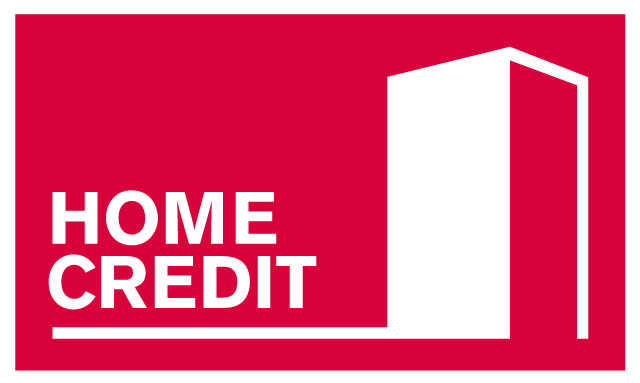

In [3]:
from pyquickhelper.helpgen import NbImage
NbImage("Home_credit_logo_640px.jpg")

# <span class="bg-danger">PRE_PROCESSING<span> 

## <span class="bg-info"> 1. application_train.csv et application_test.csv<span> 

In [4]:
application_train = pd.read_csv("data/application_train.csv")
application_test = pd.read_csv("data/application_test.csv")

In [5]:
msno.matrix(application_train,
            inline=True,
            sparkline=True,
            figsize=(12, 6),
            sort=None,
            color=(0.25, 0.45, 0.6))

In [6]:
summarise(application_train);

### <span class="bg-warning"> 1.1 Alignement des 2 jeux de données application<span>  

In [7]:
for c in application_train.columns[application_train.dtypes == 'object']:
    c_train = set(application_train[c].unique())
    c_test = set(application_test[c].unique())
    diff = c_train ^ c_test
    if len(diff) > 0:
        print('feature ' + c + ' has different values: ', diff)

feature CODE_GENDER has different values:  {'XNA'}
feature NAME_INCOME_TYPE has different values:  {'Maternity leave'}
feature NAME_FAMILY_STATUS has different values:  {'Unknown'}


__Variable 'CODE_GENDER'__

Le jeu d'entrainement contient seulement 4 valeurs nommés 'XNA' pour la colonne renseignant le genre. 

__Variable 'NAME_INCOME_TYPE'__

La colonne 'NAME_INCOME_TYPE' prend la valeur 'Maternity leave' uniquement pour le jeu d'entrainement , et pour seulement 5 emprunteurs. 

__Variable 'NAME_FAMILY_STATUS'__
De la même manière, pour la colonne NAME_FAMILY_STATUS, il y a seulement deux fois la valeur Unknown et uniquement pour le jeu d'entrainement. 

In [8]:
application_train['CODE_GENDER'] = application_train['CODE_GENDER'] \
                                                        .map(lambda x: x if x != 'XNA' else np.nan)
application_train['NAME_INCOME_TYPE'] = application_train['NAME_INCOME_TYPE'] \
                                                        .map(lambda x: x if x != 'Maternity leave' else np.nan)
application_train['NAME_FAMILY_STATUS'] = application_train['NAME_FAMILY_STATUS'] \
                                                        .map(lambda x: x if x != 'Unknown' else np.nan)

In [9]:
set(application_train.columns) - set(application_test.columns)

{'TARGET'}

### <span class="bg-warning"> 1.3 Correction des aberrations détectées pendant l'EDA<span>  

In [10]:
# Suppression des aberrations détectées chez la variable "DAYS EMPLOYED"
application_train['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
application_test['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)

# Suppression des aberrations détectées chez les variables "OBS"
application_train['OBS_30_CNT_SOCIAL_CIRCLE'][
    application_train['OBS_30_CNT_SOCIAL_CIRCLE'] > 30] == np.nan
application_train['OBS_60_CNT_SOCIAL_CIRCLE'][
    application_train['OBS_60_CNT_SOCIAL_CIRCLE'] > 30] == np.nan
application_test['OBS_30_CNT_SOCIAL_CIRCLE'][
    application_test['OBS_30_CNT_SOCIAL_CIRCLE'] > 30] == np.nan
application_test['OBS_60_CNT_SOCIAL_CIRCLE'][
    application_test['OBS_60_CNT_SOCIAL_CIRCLE'] > 30] == np.nan

37465    False
38869    False
39671    False
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: bool

### <span class="bg-warning"> 1.4 Suppression colonnes + de 60% NAN<span>  

In [11]:
application_train = Cleaning(df=application_train,
                                   missing_percent=0.6).main()
application_test = Cleaning(df=application_test,
                                   missing_percent=0.6).main()

##############################################################################
#                                Cleaning starts                             #
##############################################################################


Check numerical and categorical features


categorical_features : Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')
--------------------------------------------------------------------------------
numerical_features: Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       ...
   

,Nombre de valeurs manquantes,% de valeurs manquantes
COMMONAREA_MEDI,214865,69.870000
COMMONAREA_MODE,214865,69.870000
COMMONAREA_AVG,214865,69.870000
NONLIVINGAPARTMENTS_MODE,213514,69.430000
NONLIVINGAPARTMENTS_MEDI,213514,69.430000
NONLIVINGAPARTMENTS_AVG,213514,69.430000
FONDKAPREMONT_MODE,210295,68.390000
LIVINGAPARTMENTS_MEDI,210199,68.350000
LIVINGAPARTMENTS_AVG,210199,68.350000
LIVINGAPARTMENTS_MODE,210199,68.350000


--------------------------------------------------------------------------------



Check columns which have over:60.0 % of missing values
--------------------------------------------------------------------------------
Time Taken to check = 0:00:00.576458
--------------------------------------------------------------------------------
List of columns which have over 60.0 of missing values :
--------------------------------------------------------------------------------
['OWN_CAR_AGE', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'FLOORSMIN_AVG', 'LIVINGAPARTMENTS_AVG', 'NONLIVINGAPARTMENTS_AVG', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'FLOORSMIN_MODE', 'LIVINGAPARTMENTS_MODE', 'NONLIVINGAPARTMENTS_MODE', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'FLOORSMIN_MEDI', 'LIVINGAPARTMENTS_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'FONDKAPREMONT_MODE']
--------------------------------------------------------------------------------


Drop columns which have over:60.0 % of missing values
['OWN_CAR_AGE', 'YEARS_B

,Nombre de valeurs manquantes,% de valeurs manquantes
COMMONAREA_MEDI,33495,68.720000
COMMONAREA_MODE,33495,68.720000
COMMONAREA_AVG,33495,68.720000
NONLIVINGAPARTMENTS_MODE,33347,68.410000
NONLIVINGAPARTMENTS_AVG,33347,68.410000
NONLIVINGAPARTMENTS_MEDI,33347,68.410000
FONDKAPREMONT_MODE,32797,67.280000
LIVINGAPARTMENTS_MEDI,32780,67.250000
LIVINGAPARTMENTS_AVG,32780,67.250000
LIVINGAPARTMENTS_MODE,32780,67.250000


--------------------------------------------------------------------------------



Check columns which have over:60.0 % of missing values
--------------------------------------------------------------------------------
Time Taken to check = 0:00:00.103722
--------------------------------------------------------------------------------
List of columns which have over 60.0 of missing values :
--------------------------------------------------------------------------------
['OWN_CAR_AGE', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'FLOORSMIN_AVG', 'LIVINGAPARTMENTS_AVG', 'NONLIVINGAPARTMENTS_AVG', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'FLOORSMIN_MODE', 'LIVINGAPARTMENTS_MODE', 'NONLIVINGAPARTMENTS_MODE', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'FLOORSMIN_MEDI', 'LIVINGAPARTMENTS_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'FONDKAPREMONT_MODE']
--------------------------------------------------------------------------------


Drop columns which have over:60.0 % of missing values
['OWN_CAR_AGE', 'YEARS_B

### <span class="bg-warning"> 1.5 Imputation<span>  

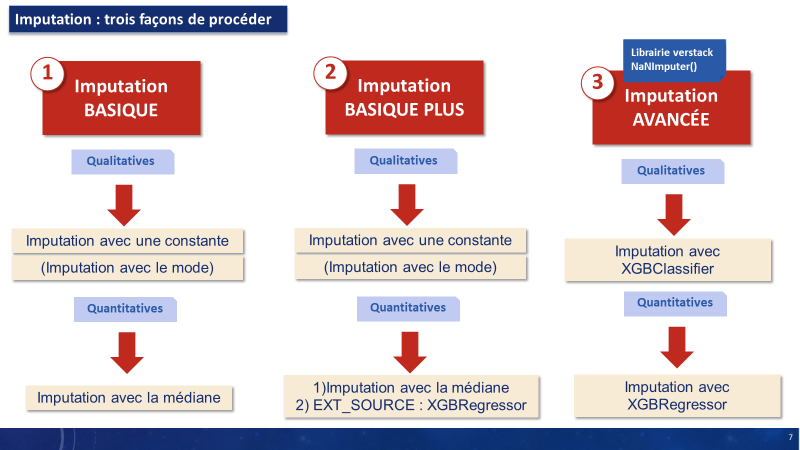

In [12]:
from pyquickhelper.helpgen import NbImage
NbImage("imputation.png")

In [13]:
# Imputation des colonnes faite selon leur type

# Variables qualitatives et quantitatives
categorical = application_train.select_dtypes(exclude=[np.number]).columns
numerical = application_train.select_dtypes(include=[np.number]).columns

In [14]:
cat = application_train[categorical]
num = application_train[numerical]
print(cat.shape, num.shape)
display(cat.head(), num.head())

(307511, 15) (307511, 90)


,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,block of flats,Block,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,NaN,NaN,NaN
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,NaN,NaN,NaN
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,NaN,NaN,NaN


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637.0,-3648.0,-2120,1,1,0,1,1,0,1.0,2,2,10,0,0,0,0,0,0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.00,0.0690,0.0833,0.0369,0.0190,0.0000,0.0252,0.0383,0.9722,0.0000,0.0690,0.0833,0.0377,0.0198,0.0,0.0250,0.0369,0.9722,0.00,0.0690,0.0833,0.0375,0.0193,0.00,0.0149,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188.0,-1186.0,-291,1,1,0,1,1,0,2.0,1,1,11,0,0,0,0,0,0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.08,0.0345,0.2917,0.0130,0.0549,0.0098,0.0924,0.0538,0.9851,0.0806,0.0345,0.2917,0.0128,0.0554,0.0,0.0968,0.0529,0.9851,0.08,0.0345,0.2917,0.0132,0.0558,0.01,0.0714,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225.0,-4260.0,-2531,1,1,1,1,1,0,1.0,2,2,9,0,0,0,0,0,0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039.0,-9833.0,-2437,1,1,0,1,0,0,2.0,2,2,17,0,0,0,0,0,0,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038.0,-4311.0,-3458,1,1,0,1,0,0,1.0,2,2,11,0,0,0,0,1,1,NaN,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


#### <span class="bg-success"> Imputation BASIQUE<span>

In [15]:
application_train_basique = application_train.copy()

In [16]:
application_test_basique = application_test.copy()

##### Variables quantitatives
Imputation par la __médiane__

In [17]:
#Variables quantitatives
application_train_basique.fillna(application_train_basique[numerical].median(),
                                 inplace=True)

In [18]:
summarise(application_train_basique[numerical]);

##### Variables qualitatives
Imputation par le __mode__

In [19]:
# Imputation des valeurs manquantes des variables qualitatives par le mode
for c in application_train_basique[categorical]:
    mode = application_train_basique[c].mode()[0]
    application_train_basique[c] = application_train_basique[c].fillna(mode)

In [20]:
summarise(application_train_basique[categorical])

,n_missing,p_missing,n_unique,dtype
NAME_CONTRACT_TYPE,0,0.0,2,object
CODE_GENDER,0,0.0,2,object
FLAG_OWN_CAR,0,0.0,2,object
FLAG_OWN_REALTY,0,0.0,2,object
NAME_TYPE_SUITE,0,0.0,7,object
NAME_INCOME_TYPE,0,0.0,7,object
NAME_EDUCATION_TYPE,0,0.0,5,object
NAME_FAMILY_STATUS,0,0.0,5,object
NAME_HOUSING_TYPE,0,0.0,6,object
OCCUPATION_TYPE,0,0.0,18,object


In [21]:
msno.matrix(application_train_basique,
            inline=True,
            sparkline=True,
            figsize=(6, 3),
            sort=None,
            color=(0.25, 0.45, 0.6))

##### Test

In [22]:
# Variables qualitatives et quantitatives
categorical_test = application_test.select_dtypes(exclude=[np.number]).columns
numerical_test = application_test.select_dtypes(include=[np.number]).columns
#Variables quantitatives
application_test_basique.fillna(
    application_test_basique[numerical_test].median(), inplace=True)
# Imputation des valeurs manquantes des variables qualitatives par le mode
for c in application_test_basique[categorical_test]:
    mode = application_test_basique[c].mode()[0]
    application_test_basique[c] = application_test_basique[c].fillna(mode)

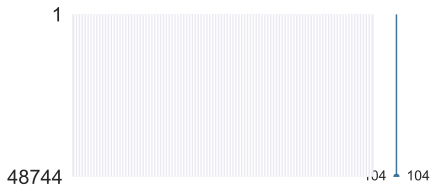

In [23]:
msno.matrix(application_test_basique,
            inline=True,
            sparkline=True,
            figsize=(6, 3),
            sort=None,
            color=(0.25, 0.45, 0.6))

### <span class="bg-warning"> 1.6 Feature engineering : création manuelle de nouvelles variables<span>  

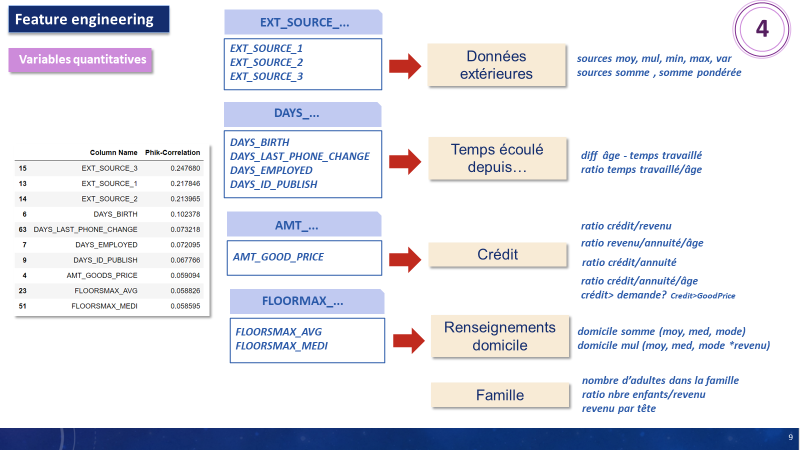

In [24]:
NbImage("feature_engineering_categorical.png")
NbImage("feature_engineering_numerical.png")

In [25]:
def feature_engineering(applications):
    '''
        Function to perform feature engineering on numeric columns and categorical columns
        based on domain knowledge.
        
        Inputs:
            self
            data: DataFrame
                The tables of whose features are to be generated
        
        Returns: 
            None
        '''

    #############################   VARIABLES CATEGORIELLES  ######################################
    #flag regions
    applications['FLAG_REGIONS'] = applications[
        'REG_REGION_NOT_LIVE_REGION'] + applications[
            'REG_REGION_NOT_WORK_REGION'] + applications[
                'LIVE_REGION_NOT_WORK_REGION'] + applications[
                    'REG_CITY_NOT_LIVE_CITY'] + applications[
                        'REG_CITY_NOT_WORK_CITY'] + applications[
                            'LIVE_CITY_NOT_WORK_CITY']
    #flag contacts sum
    applications[
        'FLAG_CONTACTS_SUM'] = applications['FLAG_MOBIL'] + applications[
            'FLAG_EMP_PHONE'] + applications['FLAG_WORK_PHONE'] + applications[
                'FLAG_CONT_MOBILE'] + applications[
                    'FLAG_PHONE'] + applications['FLAG_EMAIL']

    #Flag Documents combined
    docs = [_f for _f in applications.columns if 'FLAG_DOC' in _f]
    applications['FLAGS_DOCUMENTS_AVG'] = applications[docs].mean(axis=1)
    applications['FLAGS_DOCUMENTS_STD'] = applications[docs].std(axis=1)
    applications['FLAGS_DOCUMENTS_KURT'] = applications[docs].kurtosis(axis=1)
    applications['FLAGS_DOCUMENTS_SUM'] = applications[docs].sum(axis=1)

    ##################################   VARIABLES NUMERIQUES  ########################################
    #âge ratios et diffs
    applications['AGE_EMPLOYED_DIFF'] = applications[
        'DAYS_BIRTH'] - applications['DAYS_EMPLOYED']
    applications['EMPLOYED_TO_AGE_RATIO'] = applications['DAYS_EMPLOYED'] / (
        applications['DAYS_BIRTH'] + 0.00001)

    #family members
    #Adultes
    applications['CNT_NON_CHILDREN'] = applications[
        'CNT_FAM_MEMBERS'] - applications['CNT_CHILDREN']
    #ratio nbre enfants/revenu
    applications['CHILDREN_INCOME_RATIO'] = applications['CNT_CHILDREN'] / (
        applications['AMT_INCOME_TOTAL'] + 0.00001)
    #revenu par tête
    applications['PER_CAPITA_INCOME'] = applications['AMT_INCOME_TOTAL'] / (
        applications['CNT_FAM_MEMBERS'] + 0.00001)
    #téléphone
    applications['NEW_PHONE_TO_BIRTH_RATIO'] = applications[
        'DAYS_LAST_PHONE_CHANGE'] / (applications['DAYS_BIRTH'] + 0.00001)
    applications['NEW_PHONE_TO_EMPLOY_RATIO'] = applications[
        'DAYS_LAST_PHONE_CHANGE'] / (applications['DAYS_EMPLOYED'] + 0.00001)

    #apartment scores
    applications['APARTMENTS_SUM_AVG'] = applications[
        'APARTMENTS_AVG'] + applications['BASEMENTAREA_AVG'] + applications[
            'YEARS_BEGINEXPLUATATION_AVG'] + applications[
                'ELEVATORS_AVG'] + applications['ENTRANCES_AVG'] + applications[
                    'FLOORSMAX_AVG'] + applications[
                        'LANDAREA_AVG'] + applications[
                            'LIVINGAREA_AVG'] + applications[
                                'NONLIVINGAREA_AVG']

    applications['APARTMENTS_SUM_MODE'] = applications[
        'APARTMENTS_MODE'] + applications['BASEMENTAREA_MODE'] + applications[
            'YEARS_BEGINEXPLUATATION_MODE'] + applications[
                'ELEVATORS_MODE'] + applications[
                    'ENTRANCES_MODE'] + applications[
                        'FLOORSMAX_MODE'] + applications[
                            'LANDAREA_MODE'] + applications[
                                'LIVINGAREA_MODE'] + applications[
                                    'NONLIVINGAREA_MODE'] + applications[
                                        'TOTALAREA_MODE']

    applications['APARTMENTS_SUM_MEDI'] = applications[
        'APARTMENTS_MEDI'] + applications['BASEMENTAREA_MEDI'] + applications[
            'YEARS_BEGINEXPLUATATION_MEDI'] + applications[
                'ELEVATORS_MEDI'] + applications[
                    'ENTRANCES_MEDI'] + applications[
                        'FLOORSMAX_MEDI'] + applications[
                            'LANDAREA_MEDI'] + applications[
                                'LIVINGAREA_MEDI'] + applications[
                                    'NONLIVINGAREA_MEDI']
    applications['INCOME_APARTMENT_AVG_MUL'] = applications[
        'APARTMENTS_SUM_AVG'] * applications['AMT_INCOME_TOTAL']
    applications['INCOME_APARTMENT_MODE_MUL'] = applications[
        'APARTMENTS_SUM_MODE'] * applications['AMT_INCOME_TOTAL']
    applications['INCOME_APARTMENT_MEDI_MUL'] = applications[
        'APARTMENTS_SUM_MEDI'] * applications['AMT_INCOME_TOTAL']

    ## Credit, revenu, rente
    #OVER_EXPECT_CREDIT: actual credit larger than goods price
    applications['OVER_EXPECT_CREDIT'] = (
        applications['AMT_CREDIT'] > applications['AMT_GOODS_PRICE']).map({
            False:
            0,
            True:
            1
        })
    applications['CREDIT_ANNUITY_RATIO'] = applications['AMT_CREDIT'] / (
        applications['AMT_ANNUITY'] + 0.00001)  #ratio credit/rente
    applications['RATIO_INCOME_GOODS'] = applications[
        'AMT_INCOME_TOTAL'] - applications[
            'AMT_GOODS_PRICE']  #crédit>goodprice?
    applications['INCOME_AGE'] = applications['AMT_INCOME_TOTAL'] / (
        applications['DAYS_BIRTH'] + 0.00001)  # ratio revenu/âge
    income_by_org = applications[[
        'AMT_INCOME_TOTAL', 'ORGANIZATION_TYPE'
    ]].groupby('ORGANIZATION_TYPE').median()['AMT_INCOME_TOTAL']
    applications['INCOME_BY_ORG'] = applications['ORGANIZATION_TYPE'].map(
        income_by_org)  # revenu/secteur
    applications['CREDIT_AGE'] = applications['AMT_CREDIT'] / (
        applications['DAYS_BIRTH'] + 0.00001)  # ratio crédit/âge
    applications['CREDIT_INCOME'] = applications['AMT_CREDIT'] / (
        applications['AMT_INCOME_TOTAL'] + 0.00001)  # ratio crédit/revenu
    applications['ANNUITY_INCOME'] = applications['AMT_ANNUITY'] / (
        applications['AMT_INCOME_TOTAL'] + 0.00001)  # ratio rente/revenu
    applications['ANNUITY_CREDIT'] = applications['AMT_ANNUITY'] / (
        applications['AMT_CREDIT'] + 0.00001)  # ratio rente/credit

    #Ext_sources sum, mean, mul, max, min, var, weighted
    applications['EXT_SOURCE_SUM'] = applications[[
        'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3'
    ]].sum(axis=1)

    applications['EXT_SOURCE_MEAN'] = applications[[
        'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3'
    ]].mean(axis=1)

    applications[
        'EXT_SOURCE_MUL'] = applications['EXT_SOURCE_1'] * applications[
            'EXT_SOURCE_2'] * applications['EXT_SOURCE_3']

    applications['EXT_SOURCE_MAX'] = [
        max(ele1, ele2, ele3) for ele1, ele2, ele3 in zip(
            applications['EXT_SOURCE_1'], applications['EXT_SOURCE_2'],
            applications['EXT_SOURCE_3'])
    ]
    applications['EXT_SOURCE_MIN'] = [
        min(ele1, ele2, ele3) for ele1, ele2, ele3 in zip(
            applications['EXT_SOURCE_1'], applications['EXT_SOURCE_2'],
            applications['EXT_SOURCE_3'])
    ]
    applications['EXT_SOURCE_VAR'] = [
        np.var([ele1, ele2, ele3]) for ele1, ele2, ele3 in zip(
            applications['EXT_SOURCE_1'], applications['EXT_SOURCE_2'],
            applications['EXT_SOURCE_3'])
    ]
    applications['WEIGHTED_EXT_SOURCE'] = applications[
        'EXT_SOURCE_1'] * 2 + applications['EXT_SOURCE_2'] * 3 + applications[
            'EXT_SOURCE_3'] * 4

In [26]:
#Création nouvelles variables sur train
feature_engineering(application_train_basique)
#Création nouvelles variables sur test
feature_engineering(application_test_basique)

In [27]:
print(application_train_basique.shape)
summarise(application_train_basique)

(307511, 140)


,n_missing,p_missing,n_unique,dtype
SK_ID_CURR,0,0.0,307511,int64
FLAG_DOCUMENT_19,0,0.0,2,int64
FLAG_DOCUMENT_13,0,0.0,2,int64
FLAG_DOCUMENT_14,0,0.0,2,int64
FLAG_DOCUMENT_15,0,0.0,2,int64
FLAG_DOCUMENT_16,0,0.0,2,int64
FLAG_DOCUMENT_17,0,0.0,2,int64
FLAG_DOCUMENT_18,0,0.0,2,int64
FLAG_DOCUMENT_20,0,0.0,2,int64
FLAG_DOCUMENT_11,0,0.0,2,int64


In [28]:
print(application_test_basique.shape)
summarise(application_test_basique)

(48744, 139)


,n_missing,p_missing,n_unique,dtype
SK_ID_CURR,0,0.0,48744,int64
FLAG_DOCUMENT_19,0,0.0,1,int64
FLAG_DOCUMENT_13,0,0.0,1,int64
FLAG_DOCUMENT_14,0,0.0,1,int64
FLAG_DOCUMENT_15,0,0.0,1,int64
FLAG_DOCUMENT_16,0,0.0,1,int64
FLAG_DOCUMENT_17,0,0.0,1,int64
FLAG_DOCUMENT_18,0,0.0,2,int64
FLAG_DOCUMENT_20,0,0.0,1,int64
FLAG_REGIONS,0,0.0,7,int64


In [29]:
application_train = application_train_basique.copy()
application_test = application_test_basique.copy()

(Phil) https://www.kaggle.com/c/home-credit-default-risk/discussion/64821

"La caractéristique la plus importante que j'ai conçue, (mesurée par le gain dans le modèle LGBM), était la suivante : 

- 1) neighbors_target_mean_500 : La valeur TARGET moyenne des 500 voisins les plus proches de chaque ligne, où chaque voisinage était défini par les trois sources externes et le ratio crédit/annuité.

In [30]:
from sklearn.neighbors import KNeighborsClassifier


def neighbors_EXT_SOURCE_feature():
    '''
        Function to generate a feature which contains the means of TARGET 
        of 500 neighbors of a particular row.
        
        Inputs:
            self
        
        Returns:
            None
        '''

    #https://www.kaggle.com/c/home-credit-default-risk/discussion/64821
    #imputing the mean of 500 nearest neighbor's target values for each application
    #neighbors are computed using EXT_SOURCE feature and CREDIT_ANNUITY_RATIO

    knn = KNeighborsClassifier(500, n_jobs=-1)

    train_data_for_neighbors = application_train[[
        'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'CREDIT_ANNUITY_RATIO'
    ]].fillna(0)

    train_target = application_train.TARGET
    test_data_for_neighbors = application_test[[
        'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'CREDIT_ANNUITY_RATIO'
    ]].fillna(0)

    knn.fit(train_data_for_neighbors, train_target)

    train_500_neighbors = knn.kneighbors(train_data_for_neighbors)[1]
    test_500_neighbors = knn.kneighbors(test_data_for_neighbors)[1]

    #adding the means of targets of 500 neighbors to new column
    application_train['TARGET_NEIGHBORS_500_MEAN'] = [
        application_train['TARGET'].iloc[ele].mean()
        for ele in train_500_neighbors
    ]
    application_test['TARGET_NEIGHBORS_500_MEAN'] = [
        application_train['TARGET'].iloc[ele].mean()
        for ele in test_500_neighbors
    ]

In [31]:
#500 Neighbors Target mean
neighbors_EXT_SOURCE_feature()

In [32]:
application_train.shape, application_test.shape

((307511, 141), (48744, 140))

### <span class="bg-warning"> 1.7 Encodage des variables categorielles<span>  

In [33]:
##Train
# Categorical features with Binary encode (0 or 1; two categories)
for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
    application_train[bin_feature], uniques = pd.factorize(
        application_train[bin_feature])
    
# Categorical features with One-Hot encode
application_train, cat_cols = one_hot_encoder(application_train)

##Test
# Categorical features with Binary encode (0 or 1; two categories)
for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
    application_test[bin_feature], uniques = pd.factorize(
        application_test[bin_feature])
    
# Categorical features with One-Hot encode
application_test, cat_cols = one_hot_encoder(application_test)

In [34]:
application_train.shape, application_test.shape

((307511, 268), (48744, 267))

In [35]:
set(application_train)-set(application_test)

{'TARGET'}

In [36]:
set(application_test)-set(application_train)

set()

### <span class="bg-warning"> 1.8 Suppression des variables colinéaires<span>  

In [37]:
app_train = application_train.copy()
app_test = application_test.copy()

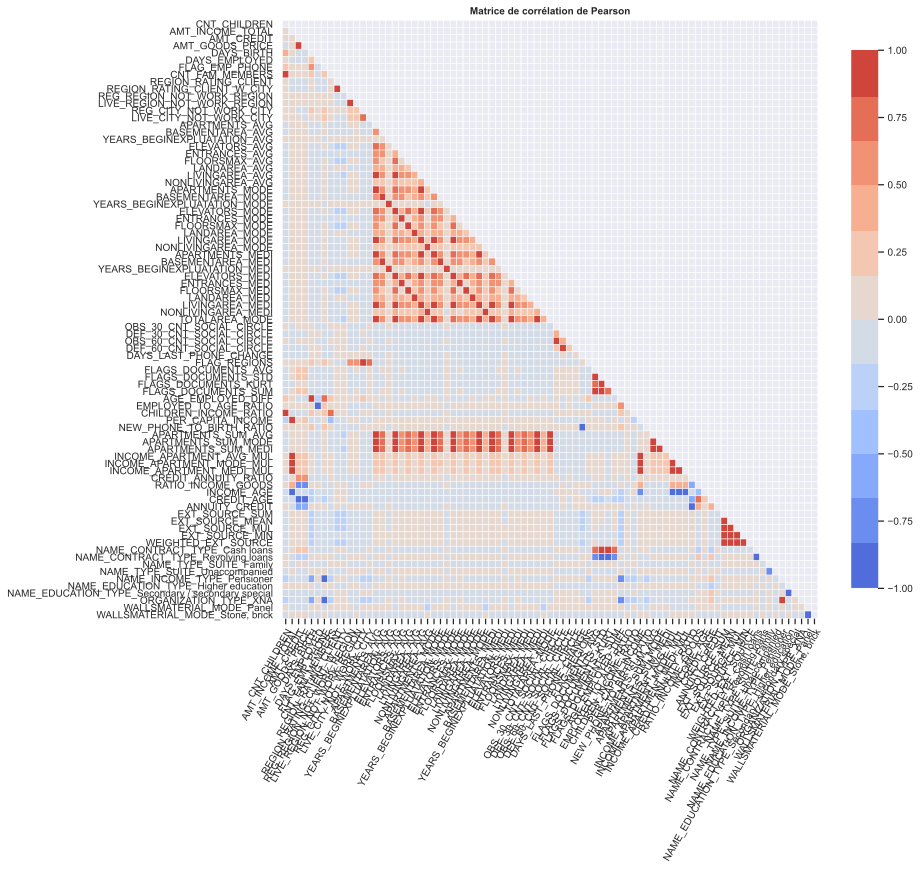

In [38]:
# Matrice de correlation de Pearson
numerical = app_train.select_dtypes(include=[np.number]).columns
corr = app_train[numerical].corr()

cols_high_corr = corr[((np.abs(corr) > 0.8) & (np.abs(corr) < 1)).any(1)].index
corr_high_corr = app_train[cols_high_corr].corr()

plot_heatmap(corr_high_corr,
             'Matrice de corrélation de Pearson',
             shape='tri',
             annot=False,
             fmt='.2f',
             figsize=(12, 11),
             vmin=-1,
             vmax=1,
             center=0,
             palette=sns.color_palette("coolwarm", 12))

In [39]:
#Identify Correlated Variables
# Threshold for removing correlated variables
threshold = 0.8

# Absolute value correlation matrix
corr_matrix = app_train.corr().abs()
corr_matrix.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_REGIONS,FLAG_CONTACTS_SUM,FLAGS_DOCUMENTS_AVG,FLAGS_DOCUMENTS_STD,FLAGS_DOCUMENTS_KURT,FLAGS_DOCUMENTS_SUM,AGE_EMPLOYED_DIFF,EMPLOYED_TO_AGE_RATIO,CNT_NON_CHILDREN,CHILDREN_INCOME_RATIO,PER_CAPITA_INCOME,NEW_PHONE_TO_BIRTH_RATIO,NEW_PHONE_TO_EMPLOY_RATIO,APARTMENTS_SUM_AVG,APARTMENTS_SUM_MODE,APARTMENTS_SUM_MEDI,INCOME_APARTMENT_AVG_MUL,INCOME_APARTMENT_MODE_MUL,INCOME_APARTMENT_MEDI_MUL,OVER_EXPECT_CREDIT,CREDIT_ANNUITY_RATIO,RATIO_INCOME_GOODS,INCOME_AGE,INCOME_BY_ORG,CREDIT_AGE,CREDIT_INCOME,ANNUITY_INCOME,ANNUITY_CREDIT,EXT_SOURCE_SUM,EXT_SOURCE_MEAN,EXT_SOURCE_MUL,EXT_SOURCE_MAX,EXT_SOURCE_MIN,EXT_SOURCE_VAR,WEIGHTED_EXT_SOURCE,TARGET_NEIGHBORS_500_MEAN,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_CONTRACT_TYPE_nan,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATI

In [40]:
# Upper triangle of correlations
upper = corr_matrix.where(
    np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_REGIONS,FLAG_CONTACTS_SUM,FLAGS_DOCUMENTS_AVG,FLAGS_DOCUMENTS_STD,FLAGS_DOCUMENTS_KURT,FLAGS_DOCUMENTS_SUM,AGE_EMPLOYED_DIFF,EMPLOYED_TO_AGE_RATIO,CNT_NON_CHILDREN,CHILDREN_INCOME_RATIO,PER_CAPITA_INCOME,NEW_PHONE_TO_BIRTH_RATIO,NEW_PHONE_TO_EMPLOY_RATIO,APARTMENTS_SUM_AVG,APARTMENTS_SUM_MODE,APARTMENTS_SUM_MEDI,INCOME_APARTMENT_AVG_MUL,INCOME_APARTMENT_MODE_MUL,INCOME_APARTMENT_MEDI_MUL,OVER_EXPECT_CREDIT,CREDIT_ANNUITY_RATIO,RATIO_INCOME_GOODS,INCOME_AGE,INCOME_BY_ORG,CREDIT_AGE,CREDIT_INCOME,ANNUITY_INCOME,ANNUITY_CREDIT,EXT_SOURCE_SUM,EXT_SOURCE_MEAN,EXT_SOURCE_MUL,EXT_SOURCE_MAX,EXT_SOURCE_MIN,EXT_SOURCE_VAR,WEIGHTED_EXT_SOURCE,TARGET_NEIGHBORS_500_MEAN,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_CONTRACT_TYPE_nan,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATI

In [41]:
# Select columns with correlations above threshold
to_drop = [
    column for column in upper.columns if any(upper[column] > threshold)
]

print('There are %d columns to remove.' % (len(to_drop)))
print('#'*80)
print(to_drop)

There are 59 columns to remove.
################################################################################
['AMT_GOODS_PRICE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT_W_CITY', 'LIVE_REGION_NOT_WORK_REGION', 'LIVE_CITY_NOT_WORK_CITY', 'ELEVATORS_AVG', 'LIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'LANDAREA_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'LANDAREA_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAREA_MEDI', 'TOTALAREA_MODE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'FLAG_REGIONS', 'FLAGS_DOCUMENTS_STD', 'FLAGS_DOCUMENTS_KURT', 'FLAGS_DOCUMENTS_SUM', 'AGE_EMPLOYED_DIFF', 'EMPLOYED_TO_AGE_RATIO', 'CHILDREN_INCOME_RATIO', 'PER_CAPITA_INCOME', 'NEW_PHONE_TO_BIRTH_RATIO', 'APARTMENTS_SUM_AVG', 'APARTMENTS_SUM_MODE', 'APARTMENTS_SUM_MEDI', 'INCOME_

In [42]:
#Drop Correlated Variables
app_train = app_train.drop(columns=to_drop)
app_test = app_test.drop(columns=to_drop)

print('App_train shape: ', app_train.shape)
print('App_test shape: ', app_test.shape)

App_train shape:  (307511, 209)
App_test shape:  (48744, 208)


## <span class="bg-primary"> Prêts antérieurs chez d'autres organismes financiers<span> 

## <span class="bg-info"> 2. bureau.csv et bureau_balance.csv<span> 

Ce jeu de données présente les données de prêt de chaque client avec toutes les institutions financières __autres__ que Home credit. 

Pour chaque SK_ID_CURR unique, nous avons plusieurs SK_ID_BUREAU, chacun étant une transaction de prêt unique d'autres institutions financières utilisée par le même client et déclarée au bureau.

####  Compréhension des variables
- CREDIT_ACTIVE - Statut actuel d'un prêt - Fermé/ Actif (2 valeurs)

- CREDIT_CURRENCY - Monnaie dans laquelle la transaction a été effectuée - Monnaie1, Monnaie2, Monnaie3, Monnaie4 ( 4 valeurs)

- CREDIT_DAY_OVERDUE - Nombre de jours de retard

- CREDIT_TYPE - Crédit à la consommation, Carte de crédit, Hypothèque, Prêt automobile, Microcrédit, Prêt pour le renouvellement du fonds de roulement, Prêt pour le développement des entreprises, Prêt immobilier, Type de prêt inconnu, Autre type de prêt. Prêt en espèces, Prêt pour l'achat de matériel, Prêt pour opérateur mobile, Crédit interbancaire, Prêt pour l'achat d'actions ( 15 valeurs )

- DAYS_CREDIT - Nombre de jours écoulés depuis que le client a demandé un crédit CB par rapport à la demande actuelle Interprétation - Ces crédits sont-ils espacés uniformément dans le temps ? Sont-ils concentrés dans un même intervalle de temps ?

- DAYS_CREDIT_ENDDATE - Nombre de jours de validité du CREDIT du client au moment de la demande 
- CREDIT_DAY_OVERDUE - Nombre de jours de dépassement de la date de fin de validité du CREDIT du client au moment de la demande

- AMT_CREDIT_SUM - Total du crédit disponible pour un client 
- AMT_CREDIT_SUM_DEBT - Montant total restant à rembourser 
- AMT_CREDIT_SUM_LIMIT - Crédit actuel utilisé 
- AMT_CREDIT_SUM_OVERDUE - Paiement du crédit actuel en retard 
- CNT_CREDIT_PROLONG - Combien de fois la date du crédit a-t-elle été prolongée

In [43]:
bureau = pd.read_csv("data/bureau.csv")
bureau_balance = pd.read_csv("data/bureau_balance.csv")

In [44]:
bureau.shape

(1716428, 17)

In [45]:
summarise(bureau)

,n_missing,p_missing,n_unique,dtype
AMT_ANNUITY,1226791,0.714735,40321,float64
AMT_CREDIT_MAX_OVERDUE,1124488,0.655133,68251,float64
DAYS_ENDDATE_FACT,633653,0.369170,2917,float64
AMT_CREDIT_SUM_LIMIT,591780,0.344774,51726,float64
AMT_CREDIT_SUM_DEBT,257669,0.150119,226537,float64
DAYS_CREDIT_ENDDATE,105553,0.061496,14096,float64
AMT_CREDIT_SUM,13,0.000008,236708,float64
CREDIT_ACTIVE,0,0.000000,4,object
CREDIT_CURRENCY,0,0.000000,4,object
DAYS_CREDIT,0,0.000000,2923,int64


In [46]:
summarise(bureau_balance)

,n_missing,p_missing,n_unique,dtype
SK_ID_BUREAU,0,0.0,817395,int64
MONTHS_BALANCE,0,0.0,97,int64
STATUS,0,0.0,8,object


### <span class="bg-warning"> 2.1 Feature engineering<span>  

In [47]:
################################  BUREAU_BALANCE  ####################################################
#STATUS
#Comme nous l'avons vu dans le cadre de l'EDA, bureau_balance possède une variable appelée STATUS, 
#qui décrit l'état du prêt.
#il a 7 étiquettes, nous allons les coder
#On donne donc C et 0 comme 0 (pas de défaillance), et le reste augmente
#aussi nous donnerons à X le bénéfice du doute et le garderons comme valeur moyenne
dict_for_status = {
    'C': 0,
    '0': 0,
    '1': 1,
    '2': 2,
    'X': 3,
    '3': 4,
    '4': 5,
    '5': 6
}
bureau_balance['STATUS_FAIL'] = bureau_balance['STATUS'].map(dict_for_status)

#MONTHS BALANCE
#Pondération de "status" avec months_balance
#Valeur absolue pour months_balance(>0)
bureau_balance['MONTHS_BALANCE'] = np.abs(bureau_balance['MONTHS_BALANCE'])

######################################  BUREAU  #######################################################
dict_for_credit_active = {
    'Closed': 0,
    'Active': 1,
    'Sold': 2,
    'Bad debt': 3
}
bureau['CREDIT_ACTIVE'] = bureau['CREDIT_ACTIVE'].map(dict_for_credit_active)

#Durée du crédit
bureau['CREDIT_DURATION'] = np.abs(bureau['DAYS_CREDIT'] -
                                   bureau['DAYS_CREDIT_ENDDATE'])
bureau['CREDIT_ENDDATE_BINARY'] = bureau.apply(
    lambda x: f(x.DAYS_CREDIT_ENDDATE), axis=1)
#Retard sur le crédit
bureau['FLAG_OVERDUE_RECENT'] = [
    0 if ele == 0 else 1 for ele in bureau['CREDIT_DAY_OVERDUE']
]

### <span class="bg-warning"> 2.2 Aggregations<span>  

In [48]:
bureau = bureau.drop('CREDIT_CURRENCY', axis=1)

#### Variables catégorielles
##### bureau

In [49]:
bureau_counts = count_categorical(bureau,
                                  group_var='SK_ID_CURR',
                                  df_name='bureau')
bureau_counts.head()
bureau_counts.shape

(305811, 30)

#### Variables numériques
##### bureau

In [50]:
# Bureau numeric features

bur_num = {
    'DAYS_CREDIT': ['min', 'max','mean', 'var'],#jours avant demande
    'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],#durée restante crédit
    'DAYS_CREDIT_UPDATE': ['mean'],
    'DAYS_ENDDATE_FACT' : ['min', 'max','mean', 'var'], #jours écoulés depuis fin crédit
    'CREDIT_DAY_OVERDUE': ['max', 'mean'],#jours retard crédit
    'AMT_CREDIT_MAX_OVERDUE': ['mean'],#montant max en souffrance
    'AMT_CREDIT_SUM': ['mean', 'max'],#Montant actuel crédit
    'AMT_CREDIT_SUM_DEBT': ['mean'],#Dette actuelle
    'AMT_CREDIT_SUM_OVERDUE': ['mean'],#dette
    'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],#limite CB
    'AMT_ANNUITY': ['count', 'max', 'min', 'mean', 'var'],#intérêts
    'CNT_CREDIT_PROLONG': ['sum'],#crédit prolongé nbre
    'CREDIT_DURATION': ['min'], 
    'CREDIT_ENDDATE_BINARY' : ['mean'],
    'FLAG_OVERDUE_RECENT' : ['count']
}

bureau_agg = agg_numeric(bureau.drop(columns=['SK_ID_BUREAU']),
                         group_var='SK_ID_CURR',
                         dict_agg=bur_num,
                         df_name='bureau')
bureau_agg.head()

,SK_ID_CURR,bureau_DAYS_CREDIT_min,bureau_DAYS_CREDIT_max,bureau_DAYS_CREDIT_mean,bureau_DAYS_CREDIT_var,bureau_DAYS_CREDIT_ENDDATE_min,bureau_DAYS_CREDIT_ENDDATE_max,bureau_DAYS_CREDIT_ENDDATE_mean,bureau_DAYS_CREDIT_UPDATE_mean,bureau_DAYS_ENDDATE_FACT_min,bureau_DAYS_ENDDATE_FACT_max,bureau_DAYS_ENDDATE_FACT_mean,bureau_DAYS_ENDDATE_FACT_var,bureau_CREDIT_DAY_OVERDUE_max,bureau_CREDIT_DAY_OVERDUE_mean,bureau_AMT_CREDIT_MAX_OVERDUE_mean,bureau_AMT_CREDIT_SUM_mean,bureau_AMT_CREDIT_SUM_max,bureau_AMT_CREDIT_SUM_DEBT_mean,bureau_AMT_CREDIT_SUM_OVERDUE_mean,bureau_AMT_CREDIT_SUM_LIMIT_mean,bureau_AMT_CREDIT_SUM_LIMIT_sum,bureau_AMT_ANNUITY_count,bureau_AMT_ANNUITY_max,bureau_AMT_ANNUITY_min,bureau_AMT_ANNUITY_mean,bureau_AMT_ANNUITY_var,bureau_CNT_CREDIT_PROLONG_sum,bureau_CREDIT_DURATION_min,bureau_CREDIT_ENDDATE_BINARY_mean,bureau_FLAG_OVERDUE_RECENT_count
0,100001,-1572,-49,-735.000000,240043.666667,-1329.0,1778.0,82.428571,-93.142857,-1328.0,-544.0,-825.500000,136219.000000,0,0.0,NaN,207623.571429,378000.0,85240.928571,0.0,0.00000,0.000,7,10822.5,0.0,3545.357143,2.304583e+07,0,243.0,0.428571,7
1,100002,-1437,-103,-874.000000,186150.000000,-1072.0,780.0,-349.000000,-499.875000,-1185.0,-36.0,-697.500000,266248.300000,0,0.0,1681.029,108131.945625,450000.0,49156.200000,0.0,7997.14125,31988.565,7,0.0,0.0,0.000000,0.000000e+00,0,87.0,0.625000,8
2,100003,-2586,-606,-1400.750000,827783.583333,-2434.0,1216.0,-544.500000,-816.000000,-2131.0,-540.0,-1097.333333,802990.333333,0,0.0,0.000,254350.125000,810000.0,0.000000,0.0,202500.00000,810000.000,0,NaN,NaN,NaN,NaN,0,152.0,0.250000,4
3,100004,-1326,-408,-867.000000,421362.000000,-595.0,-382.0,-488.500000,-532.000000,-683.0,-382.0,-532.500000,45300.500000,0,0.0,0.000,94518.900000,94537.8,0.000000,0.0,0.00000,0.000,0,NaN,NaN,NaN,NaN,0,26.0,0.000000,2
4,100005,-373,-62,-190.666667,26340.333333,-128.0,1324.0,439.333333,-54.333333,-123.0,-123.0,-123.000000,NaN,0,0.0,0.000,219042.000000,568800.0,189469.500000,0.0,0.00000,0.000,3,4261.5,0.0,1420.500000,6.053461e+06,0,184.0,0.666667,3


##### bureau_balance
Aggrégation sur clé prêt

In [51]:
bb_num = {
    'MONTHS_BALANCE': ['min', 'max', 'mean', 'sum'],
    'STATUS_FAIL': ['max', 'mean']
}

# Calculate value count statistics for each `SK_ID_BUREAU`
bureau_balance_agg = agg_numeric_bb(bureau_balance,
                                    group_var='SK_ID_BUREAU',
                                    dict_agg=bb_num,
                                    df_name='bureau_balance')
bureau_balance_agg.head()

,SK_ID_BUREAU,bureau_balance_MONTHS_BALANCE_min,bureau_balance_MONTHS_BALANCE_max,bureau_balance_MONTHS_BALANCE_mean,bureau_balance_MONTHS_BALANCE_sum,bureau_balance_STATUS_FAIL_max,bureau_balance_STATUS_FAIL_mean
0,5001709,0,96,48.0,4656,3,0.340206
1,5001710,0,82,41.0,3403,3,1.084337
2,5001711,0,3,1.5,6,3,0.750000
3,5001712,0,18,9.0,171,0,0.000000
4,5001713,0,21,10.5,231,3,3.000000


Aggregation sur clé client

In [52]:
# Merge to include the SK_ID_CURR
bureau_by_loan = bureau[['SK_ID_BUREAU',
                         'SK_ID_CURR']].merge( bureau_balance_agg,
                                              on='SK_ID_BUREAU',
                                              how='left')

# Aggregate the stats for each client
bureau_balance_by_client = agg_numeric_bbc(
    bureau_by_loan.drop(columns=['SK_ID_BUREAU']),
    group_var='SK_ID_CURR',
    df_name='client')

### <span class="bg-warning"> 2.3 Merging sur app_train des 2 tables<span>  

In [53]:
# Merge with the value counts of bureau
train = app_train.merge(bureau_counts, on='SK_ID_CURR', how='left')
print(train.shape)
# Merge with the stats of bureau
train = train.merge(bureau_agg, on='SK_ID_CURR', how='left')
print(train.shape)
# Merge with the monthly information grouped by client
train = train.merge(bureau_balance_by_client, on='SK_ID_CURR', how='left')
print(train.shape)

(307511, 239)
(307511, 269)
(307511, 275)


In [54]:
summarise(train)

,n_missing,p_missing,n_unique,dtype
bureau_AMT_ANNUITY_var,244952,0.796563,36599,float64
bureau_AMT_ANNUITY_max,227502,0.739817,23582,float64
bureau_AMT_ANNUITY_min,227502,0.739817,12865,float64
bureau_AMT_ANNUITY_mean,227502,0.739817,40630,float64
client_bureau_balance_STATUS_FAIL_mean_mean,215280,0.700073,48615,float64
client_bureau_balance_STATUS_FAIL_max_mean,215280,0.700073,711,float64
client_bureau_balance_MONTHS_BALANCE_sum_mean,215280,0.700073,37235,float64
client_bureau_balance_MONTHS_BALANCE_mean_mean,215280,0.700073,7066,float64
client_bureau_balance_MONTHS_BALANCE_max_mean,215280,0.700073,5715,float64
client_bureau_balance_MONTHS_BALANCE_min_mean,215280,0.700073,3958,float64


In [55]:
new_features = list(train.columns)
print('Nombre de variables sur les données prêts Home credit et d\'autres organismes financiers: ',
      len(new_features))

Nombre de variables sur les données prêts Home credit et d'autres organismes financiers:  275


### <span class="bg-warning"> 2.4 Suppression des variables colinéaires<span>  

#### train

In [56]:
#Identify Correlated Variables
# Threshold for removing correlated variables
threshold = 0.8

# Absolute value correlation matrix
corr_matrix = train.corr().abs()
corr_matrix.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_CONTACTS_SUM,FLAGS_DOCUMENTS_AVG,CNT_NON_CHILDREN,NEW_PHONE_TO_EMPLOY_RATIO,OVER_EXPECT_CREDIT,CREDIT_ANNUITY_RATIO,INCOME_BY_ORG,CREDIT_INCOME,ANNUITY_INCOME,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,TARGET_NEIGHBORS_500_MEAN,NAME_CONTRACT_TYPE_nan,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Indu

In [57]:
# Upper triangle of correlations
upper = corr_matrix.where(
    np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_CONTACTS_SUM,FLAGS_DOCUMENTS_AVG,CNT_NON_CHILDREN,NEW_PHONE_TO_EMPLOY_RATIO,OVER_EXPECT_CREDIT,CREDIT_ANNUITY_RATIO,INCOME_BY_ORG,CREDIT_INCOME,ANNUITY_INCOME,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,TARGET_NEIGHBORS_500_MEAN,NAME_CONTRACT_TYPE_nan,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Indu

In [58]:
# Select columns with correlations above threshold
to_drop = [
    column for column in upper.columns if any(upper[column] > threshold)
]

print('There are %d columns to remove.' % (len(to_drop)))
print('#'*80)
print(to_drop)

There are 15 columns to remove.
################################################################################
['bureau_CREDIT_TYPE_Cash loan (non-earmarked)_count_norm', 'bureau_CREDIT_TYPE_Credit card_count_norm', 'bureau_CREDIT_TYPE_Interbank credit_count_norm', 'bureau_CREDIT_TYPE_Loan for purchase of shares (margin lending)_count_norm', 'bureau_CREDIT_TYPE_Mobile operator loan_count_norm', 'bureau_DAYS_CREDIT_mean', 'bureau_DAYS_ENDDATE_FACT_min', 'bureau_DAYS_ENDDATE_FACT_mean', 'bureau_AMT_CREDIT_SUM_max', 'bureau_AMT_ANNUITY_var', 'bureau_CREDIT_DURATION_min', 'bureau_FLAG_OVERDUE_RECENT_count', 'client_bureau_balance_MONTHS_BALANCE_max_mean', 'client_bureau_balance_MONTHS_BALANCE_mean_mean', 'client_bureau_balance_MONTHS_BALANCE_sum_mean']


In [59]:
#Drop Correlated Variables
train = train.drop(columns=to_drop)

print('train shape: ', train.shape)

train shape:  (307511, 260)


In [60]:
#IMPUTATION
# Variables quantitatives
numerical = train.select_dtypes(include=[np.number]).columns

#Variables quantitatives
train.fillna(train[numerical].median(),
                                 inplace=True)

#### Test

In [61]:
# Merge with the value counts of bureau
test = app_test.merge(bureau_counts, on = 'SK_ID_CURR', how = 'left')

# Merge with the stats of bureau
test = test.merge(bureau_agg, on = 'SK_ID_CURR', how = 'left')

# Merge with the value counts of bureau balance
test = test.merge(bureau_balance_by_client, on = 'SK_ID_CURR', how = 'left')

In [62]:
test.drop(to_drop, axis=1, inplace = True)

In [63]:
print('test shape: ', test.shape)

test shape:  (48744, 259)


In [64]:
#IMPUTATION
# Variables quantitatives
numerical = test.select_dtypes(include=[np.number]).columns

#Variables quantitatives
test.fillna(test[numerical].median(),
                                 inplace=True)

## <span class="bg-primary"> Prêts antérieurs chez Home Credit<span> 
    
- __previous_application__ décrit les prêts précédents chez Home Credit.

    
- __POS_CASH_balance__
- __installments_payments__ 
- __credit_card_balance__

donnent des détails sur ces prêts 

## <span class="bg-info"> 3. previous_application.csv <span> 

Cette table contient les données statiques relatives aux clients et à leurs crédits précédents avec Home Credit.

In [65]:
previous_application = pd.read_csv("data/previous_application.csv")

In [66]:
previous_application.shape

(1670214, 37)

In [67]:
summarise(previous_application)

,n_missing,p_missing,n_unique,dtype
RATE_INTEREST_PRIVILEGED,1664263,9.964370e-01,25,float64
RATE_INTEREST_PRIMARY,1664263,9.964370e-01,148,float64
AMT_DOWN_PAYMENT,895844,5.363648e-01,29278,float64
RATE_DOWN_PAYMENT,895844,5.363648e-01,207033,float64
NAME_TYPE_SUITE,820405,4.911975e-01,7,object
NFLAG_INSURED_ON_APPROVAL,673065,4.029813e-01,2,float64
DAYS_TERMINATION,673065,4.029813e-01,2830,float64
DAYS_LAST_DUE,673065,4.029813e-01,2873,float64
DAYS_LAST_DUE_1ST_VERSION,673065,4.029813e-01,4605,float64
DAYS_FIRST_DUE,673065,4.029813e-01,2892,float64


### <span class="bg-warning"> 3.1 Correction des aberrations détectées pendant l'EDA<span>  

In [68]:
# Days 365.243 values -> nan
previous_application['DAYS_FIRST_DRAWING'].replace(365243,
                                                   np.nan,
                                                   inplace=True)
previous_application['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace=True)
previous_application['DAYS_LAST_DUE_1ST_VERSION'].replace(365243,
                                                          np.nan,
                                                          inplace=True)
previous_application['DAYS_LAST_DUE'].replace(365243, np.nan, inplace=True)
previous_application['DAYS_TERMINATION'].replace(365243, np.nan, inplace=True)

#we also see abruptly large value for SELLERPLACE_AREA
previous_application['SELLERPLACE_AREA'][
    previous_application['SELLERPLACE_AREA'] == 4000000] = np.nan

### <span class="bg-warning"> 3.2 Suppression des valeurs manquantes NAN + de 90%<span>  

In [69]:
previous_application = Cleaning(df=previous_application,
                                   missing_percent=0.9).main()

##############################################################################
#                                Cleaning starts                             #
##############################################################################


Check numerical and categorical features


categorical_features : Index(['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY',
       'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE',
       'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')
--------------------------------------------------------------------------------
numerical_features: Index(['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'HOUR_APPR_PROCESS_START', 'NFLAG

,Nombre de valeurs manquantes,% de valeurs manquantes
RATE_INTEREST_PRIMARY,1664263,99.640000
RATE_INTEREST_PRIVILEGED,1664263,99.640000
DAYS_FIRST_DRAWING,1607509,96.250000
DAYS_TERMINATION,898978,53.820000
AMT_DOWN_PAYMENT,895844,53.640000
RATE_DOWN_PAYMENT,895844,53.640000
DAYS_LAST_DUE,884286,52.940000
NAME_TYPE_SUITE,820405,49.120000
DAYS_LAST_DUE_1ST_VERSION,766929,45.920000
DAYS_FIRST_DUE,713710,42.730000


--------------------------------------------------------------------------------



Check columns which have over:90.0 % of missing values
--------------------------------------------------------------------------------
Time Taken to check = 0:00:01.906901
--------------------------------------------------------------------------------
List of columns which have over 90.0 of missing values :
--------------------------------------------------------------------------------
['RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_FIRST_DRAWING']
--------------------------------------------------------------------------------


Drop columns which have over:90.0 % of missing values
['RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_FIRST_DRAWING']



The shape of the cleaning dataframe is now :
(1670214, 34)


##############################################################################
#                              Cleaning is over                              #
#############

In [70]:
#filling the NaN values for categories
categorical_columns = previous_application.dtypes[previous_application.dtypes
                                                  == 'object'].index.tolist()
previous_application[categorical_columns] = previous_application[
    categorical_columns].fillna('XNA')

### <span class="bg-warning"> 3.3 Feature engineering<span>  

In [71]:
# Add feature: ratio : somme demandée/somme obtenue
previous_application['APP_CREDIT_PERC'] = previous_application[
    'AMT_APPLICATION'] / previous_application['AMT_CREDIT']
# différence entre le montant demandé et le montant accordé.
previous_application["AMT_DIFFERENCE"] = previous_application[
    'AMT_CREDIT'] - previous_application['AMT_APPLICATION']
#Taux du prêt
previous_application['LOAN_RATE'] = previous_application[
    'AMT_ANNUITY'] / previous_application['AMT_CREDIT']

In [72]:
#label encoding the categorical variables
name_contract_dict = {
    'Approved': 0,
    'Refused': 3,
    'Canceled': 2,
    'Unused offer': 1
}
previous_application['NAME_CONTRACT_STATUS'] = previous_application[
    'NAME_CONTRACT_STATUS'].map(name_contract_dict)
yield_group_dict = {
    'XNA': 0,
    'low_action': 1,
    'low_normal': 2,
    'middle': 3,
    'high': 4
}
previous_application['NAME_YIELD_GROUP'] = previous_application[
    'NAME_YIELD_GROUP'].map(yield_group_dict)
appl_per_contract_last_dict = {'Y': 1, 'N': 0}
previous_application['FLAG_LAST_APPL_PER_CONTRACT'] = previous_application[
    'FLAG_LAST_APPL_PER_CONTRACT'].map(appl_per_contract_last_dict)

In [73]:
summarise(previous_application)

,n_missing,p_missing,n_unique,dtype
DAYS_TERMINATION,898978,5.382412e-01,2829,float64
RATE_DOWN_PAYMENT,895844,5.363648e-01,207033,float64
AMT_DOWN_PAYMENT,895844,5.363648e-01,29278,float64
DAYS_LAST_DUE,884286,5.294447e-01,2872,float64
DAYS_LAST_DUE_1ST_VERSION,766929,4.591801e-01,4604,float64
DAYS_FIRST_DUE,713710,4.273165e-01,2891,float64
NFLAG_INSURED_ON_APPROVAL,673065,4.029813e-01,2,float64
AMT_GOODS_PRICE,385515,2.308177e-01,93885,float64
LOAN_RATE,373859,2.238390e-01,530491,float64
AMT_ANNUITY,372235,2.228667e-01,357959,float64


In [74]:
#Suppression des colonnes inutiles
col_to_drop = [
    'WEEKDAY_APPR_PROCESS_START', 'NAME_CASH_LOAN_PURPOSE',
    'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_GOODS_CATEGORY',
    'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE',
    'NAME_SELLER_INDUSTRY'
]
previous_application.drop(col_to_drop, axis=1, inplace=True)

### <span class="bg-warning"> 3.4 Aggregations<span>  

#### Variables catégorielles

In [75]:
previous_application_counts = count_categorical(previous_application,
                                  group_var='SK_ID_CURR',
                                  df_name='previous')
previous_application_counts.head()

,previous_NAME_CONTRACT_TYPE_Cash loans_count,previous_NAME_CONTRACT_TYPE_Cash loans_count_norm,previous_NAME_CONTRACT_TYPE_Consumer loans_count,previous_NAME_CONTRACT_TYPE_Consumer loans_count_norm,previous_NAME_CONTRACT_TYPE_Revolving loans_count,previous_NAME_CONTRACT_TYPE_Revolving loans_count_norm,previous_NAME_CONTRACT_TYPE_XNA_count,previous_NAME_CONTRACT_TYPE_XNA_count_norm,previous_NAME_TYPE_SUITE_Children_count,previous_NAME_TYPE_SUITE_Children_count_norm,previous_NAME_TYPE_SUITE_Family_count,previous_NAME_TYPE_SUITE_Family_count_norm,previous_NAME_TYPE_SUITE_Group of people_count,previous_NAME_TYPE_SUITE_Group of people_count_norm,previous_NAME_TYPE_SUITE_Other_A_count,previous_NAME_TYPE_SUITE_Other_A_count_norm,previous_NAME_TYPE_SUITE_Other_B_count,previous_NAME_TYPE_SUITE_Other_B_count_norm,"previous_NAME_TYPE_SUITE_Spouse, partner_count","previous_NAME_TYPE_SUITE_Spouse, partner_count_norm",previous_NAME_TYPE_SUITE_Unaccompanied_count,previous_NAME_TYPE_SUITE_Unaccompanied_count_norm,previous_NAME_TYPE_SUITE_XNA_count,previous_NAME_TYPE_SUITE_XNA_count_norm,previous_NAME_CLIENT_TYPE_New_count,previous_NAME_CLIENT_TYPE_New_count_norm,previous_NAME_CLIENT_TYPE_Refreshed_count,previous_NAME_CLIENT_TYPE_Refreshed_count_norm,previous_NAME_CLIENT_TYPE_Repeater_count,previous_NAME_CLIENT_TYPE_Repeater_count_norm,previous_NAME_CLIENT_TYPE_XNA_count,previous_NAME_CLIENT_TYPE_XNA_count_norm,previous_PRODUCT_COMBINATION_Card Street_count,previous_PRODUCT_COMBINATION_Card Street_count_norm,previous_PRODUCT_COMBINATION_Card X-Sell_count,previous_PRODUCT_COMBINATION_Card X-Sell_count_norm,previous_PRODUCT_COMBINATION_Cash_count,previous_PRODUCT_COMBINATION_Cash_count_norm,previous_PRODUCT_COMBINATION_Cash Street: high_count,previous_PRODUCT_COMBINATION_Cash Street: high_count_norm,previous_PRODUCT_COMBINATION_Cash Street: low_count,previous_PRODUCT_COMBINATION_Cash Street: low_count_norm,previous_PRODUCT_COMBINATION_Cash Street: middle_count,previous_PRODUCT_COMBINATION_Cash Street: middle_count_norm,previous_PRODUCT_COMBINATION_Cash X-Sell: high_count,previous_PRODUCT_COMBINATION_Cash X-Sell: high_count_norm,previous_PRODUCT_COMBINATION_Cash X-Sell: low_count,previous_PRODUCT_COMBINATION_Cash X-Sell: low_count_norm,previous_PRODUCT_COMBINATION_Cash X-Sell: middle_count,previous_PRODUCT_COMBINATION_Cash X-Sell: middle_count_norm,previous_PRODUCT_COMBINATION_POS household with interest_count,previous_PRODUCT_COMBINATION_POS household with interest_count_norm,previous_PRODUCT_COMBINATION_POS household without interest_count,previous_PRODUCT_COMBINATION_POS household without interest_count_norm,previous_PRODUCT_COMBINATION_POS industry with interest_count,previous_PRODUCT_COMBINATION_POS industry with interest_count_norm,previous_PRODUCT_COMBINATION_POS industry without interest_count,previous_PRODUCT_COMBINATION_POS industry without interest_count_norm,previous_PRODUCT_COMBINATION_POS mobile with interest_count,previous_PRODUCT_COMBINATION_POS mobile with interest_count_norm,previous_PRODUCT_COMBINATION_POS mobile without interest_count,previous_PRODUCT_COMBINATION_POS mobile without interest_count_norm,previous_PRODUCT_COMBINATION_POS other with interest_count,previous_PRODUCT_COMBINATION_POS other with interest_count_norm,previous_PRODUCT_COMBINATION_POS others without interest_count,previous_PRODUCT_COMBINATION_POS others without interest_count_norm,previous_PRODUCT_COMBINATION_XNA_count,previous_PRODUCT_COMBINATION_XNA_count_norm
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,0,0.000000,1,1.000000,0,0.0,0,0.0,0,0.0,1,1.000000,0,0.0,0,0.0,0,0.0,0,0.0,0,0.000000,0,0.0,0,0.0,1,1.000000,0,0.000000,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.000000,0,0.0,0,0.000000,0,0.0,0,0.000000,0,0.0,1,1.0,0,0.0,0,0.0,0,0.0,0,0.0
100002,0,0.000000,1,1.000000,0,0.0,0,0.0,0,0.0,0,0.000000,0,0.0,0,0.0,0,0.0,0,0.0,0,0.000000,1,1.0,1,1.0,0,0.000000,0,0.000000,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0

#### Variables numériques

In [76]:
prev_num = {
    'AMT_ANNUITY': ['min', 'max', 'mean'],
    'AMT_APPLICATION': ['min', 'max', 'mean'],
    'AMT_CREDIT': ['min', 'max', 'mean'],
    'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
    'AMT_DOWN_PAYMENT': ['max', 'mean'],
    'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
    'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
    'DAYS_DECISION': ['min', 'mean'],
    'CNT_PAYMENT': ['mean', 'sum'],
    'DAYS_FIRST_DUE': ['sum'],
    'SELLERPLACE_AREA' : ['sum', 'max'],
    'DAYS_LAST_DUE': ['max'], 
    'APP_CREDIT_PERC': ['min', 'mean'],
    'NAME_CONTRACT_STATUS': ['mean'],
    'AMT_DIFFERENCE': ['min'], 
    'LOAN_RATE': ['max', 'mean']
}

previous_application_agg = agg_numeric(
    previous_application.drop(columns=['SK_ID_PREV']),
    group_var='SK_ID_CURR',
    dict_agg=prev_num,
    df_name='previous')
previous_application_agg.head()

,SK_ID_CURR,previous_AMT_ANNUITY_min,previous_AMT_ANNUITY_max,previous_AMT_ANNUITY_mean,previous_AMT_APPLICATION_min,previous_AMT_APPLICATION_max,previous_AMT_APPLICATION_mean,previous_AMT_CREDIT_min,previous_AMT_CREDIT_max,previous_AMT_CREDIT_mean,previous_APP_CREDIT_PERC_min,previous_APP_CREDIT_PERC_mean,previous_AMT_DOWN_PAYMENT_max,previous_AMT_DOWN_PAYMENT_mean,previous_AMT_GOODS_PRICE_min,previous_AMT_GOODS_PRICE_max,previous_AMT_GOODS_PRICE_mean,previous_RATE_DOWN_PAYMENT_min,previous_RATE_DOWN_PAYMENT_max,previous_RATE_DOWN_PAYMENT_mean,previous_DAYS_DECISION_min,previous_DAYS_DECISION_mean,previous_CNT_PAYMENT_mean,previous_CNT_PAYMENT_sum,previous_DAYS_FIRST_DUE_sum,previous_SELLERPLACE_AREA_sum,previous_SELLERPLACE_AREA_max,previous_DAYS_LAST_DUE_max,previous_NAME_CONTRACT_STATUS_mean,previous_AMT_DIFFERENCE_min,previous_LOAN_RATE_max,previous_LOAN_RATE_mean
0,100001,3951.000,3951.000,3951.000,24835.5,24835.5,24835.50,23787.0,23787.0,23787.00,1.044079,1.044079,2520.0,2520.0,24835.5,24835.5,24835.5,0.104326,0.104326,0.104326,-1740,-1740.0,8.0,8.0,-1709.0,23.0,23.0,-1619.0,0.0,-1048.5,0.166099,0.166099
1,100002,9251.775,9251.775,9251.775,179055.0,179055.0,179055.00,179055.0,179055.0,179055.00,1.000000,1.000000,0.0,0.0,179055.0,179055.0,179055.0,0.000000,0.000000,0.000000,-606,-606.0,24.0,24.0,-565.0,500.0,500.0,-25.0,0.0,0.0,0.051670,0.051670
2,100003,6737.310,98356.995,56553.990,68809.5,900000.0,435436.50,68053.5,1035882.0,484191.00,0.868825,0.949329,6885.0,3442.5,68809.5,900000.0,435436.5,0.000000,0.100061,0.050030,-2341,-1305.0,10.0,30.0,-3823.0,1599.0,1400.0,-536.0,0.0,-756.0,0.185200,0.126383
3,100004,5357.250,5357.250,5357.250,24282.0,24282.0,24282.00,20106.0,20106.0,20106.00,1.207699,1.207699,4860.0,4860.0,24282.0,24282.0,24282.0,0.212008,0.212008,0.212008,-815,-815.0,4.0,4.0,-784.0,30.0,30.0,-724.0,0.0,-4176.0,0.266450,0.266450
4,100005,4813.200,4813.200,4813.200,0.0,44617.5,22308.75,0.0,40153.5,20076.75,1.111173,1.111173,4464.0,4464.0,44617.5,44617.5,44617.5,0.108964,0.108964,0.108964,-757,-536.0,12.0,12.0,-706.0,36.0,37.0,-466.0,1.0,-4464.0,0.119870,0.119870


### <span class="bg-warning"> 3.5 Merging<span>  

In [77]:
# Merge with the value counts of previous_application
train = train.merge(previous_application_counts, on='SK_ID_CURR', how='left')

# Merge with the stats of previous_application
train = train.merge(previous_application_agg, on='SK_ID_CURR', how='left')

In [78]:
summarise(train)

,n_missing,p_missing,n_unique,dtype
previous_DAYS_LAST_DUE_max,38399,0.124870,2816,float64
previous_RATE_DOWN_PAYMENT_mean,33906,0.110259,166570,float64
previous_AMT_DOWN_PAYMENT_max,33906,0.110259,21521,float64
previous_AMT_DOWN_PAYMENT_mean,33906,0.110259,54136,float64
previous_RATE_DOWN_PAYMENT_min,33906,0.110259,64768,float64
previous_RATE_DOWN_PAYMENT_max,33906,0.110259,118254,float64
previous_AMT_GOODS_PRICE_min,17429,0.056678,47005,float64
previous_AMT_GOODS_PRICE_max,17429,0.056678,48658,float64
previous_AMT_GOODS_PRICE_mean,17429,0.056678,185849,float64
previous_LOAN_RATE_mean,16872,0.054866,277312,float64


In [79]:
new_features = list(train.columns)
print('Nombre de variables sur les données prêts Home credit et d\'autres organismes financiers: ',
      len(new_features))

Nombre de variables sur les données prêts Home credit et d'autres organismes financiers:  359


In [80]:
train.shape

(307511, 359)

### <span class="bg-warning"> 3.6 Suppression des variables colinéaires<span>  

#### train

In [81]:
#Identify Correlated Variables
# Threshold for removing correlated variables
threshold = 0.8

# Absolute value correlation matrix
corr_matrix = train.corr().abs()
corr_matrix.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_CONTACTS_SUM,FLAGS_DOCUMENTS_AVG,CNT_NON_CHILDREN,NEW_PHONE_TO_EMPLOY_RATIO,OVER_EXPECT_CREDIT,CREDIT_ANNUITY_RATIO,INCOME_BY_ORG,CREDIT_INCOME,ANNUITY_INCOME,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,TARGET_NEIGHBORS_500_MEAN,NAME_CONTRACT_TYPE_nan,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Indu

In [82]:
# Upper triangle of correlations
upper = corr_matrix.where(
    np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_CONTACTS_SUM,FLAGS_DOCUMENTS_AVG,CNT_NON_CHILDREN,NEW_PHONE_TO_EMPLOY_RATIO,OVER_EXPECT_CREDIT,CREDIT_ANNUITY_RATIO,INCOME_BY_ORG,CREDIT_INCOME,ANNUITY_INCOME,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,TARGET_NEIGHBORS_500_MEAN,NAME_CONTRACT_TYPE_nan,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Indu

In [83]:
# Select columns with correlations above threshold
to_drop = [
    column for column in upper.columns if any(upper[column] > threshold)
]

print('There are %d columns to remove.' % (len(to_drop)))
print('#'*80)
print(to_drop)

There are 21 columns to remove.
################################################################################
['previous_NAME_CONTRACT_TYPE_Consumer loans_count_norm', 'previous_NAME_CONTRACT_TYPE_XNA_count_norm', 'previous_NAME_CLIENT_TYPE_Repeater_count', 'previous_NAME_CLIENT_TYPE_Repeater_count_norm', 'previous_PRODUCT_COMBINATION_Card Street_count', 'previous_PRODUCT_COMBINATION_Card Street_count_norm', 'previous_PRODUCT_COMBINATION_Card X-Sell_count_norm', 'previous_PRODUCT_COMBINATION_Cash_count', 'previous_PRODUCT_COMBINATION_XNA_count', 'previous_PRODUCT_COMBINATION_XNA_count_norm', 'previous_AMT_ANNUITY_mean', 'previous_AMT_APPLICATION_max', 'previous_AMT_CREDIT_min', 'previous_AMT_CREDIT_max', 'previous_AMT_CREDIT_mean', 'previous_AMT_DOWN_PAYMENT_mean', 'previous_AMT_GOODS_PRICE_max', 'previous_AMT_GOODS_PRICE_mean', 'previous_RATE_DOWN_PAYMENT_mean', 'previous_SELLERPLACE_AREA_max', 'previous_AMT_DIFFERENCE_min']


In [84]:
#Drop Correlated Variables
train = train.drop(columns=to_drop)

print('train shape: ', train.shape)

train shape:  (307511, 338)


In [85]:
#IMPUTATION
# Variables quantitatives
numerical = train.select_dtypes(include=[np.number]).columns

#Variables quantitatives
train.fillna(train[numerical].median(),
                                 inplace=True)

In [86]:
summarise(train)

,n_missing,p_missing,n_unique,dtype
SK_ID_CURR,0,0.0,307511,int64
bureau_CREDIT_TYPE_Loan for the purchase of equipment_count_norm,0,0.0,14,float64
bureau_CREDIT_TYPE_Real estate loan_count,0,0.0,2,float64
bureau_CREDIT_TYPE_Mortgage_count_norm,0,0.0,75,float64
bureau_CREDIT_TYPE_Mortgage_count,0,0.0,8,float64
bureau_CREDIT_TYPE_Mobile operator loan_count,0,0.0,2,float64
bureau_CREDIT_TYPE_Microloan_count_norm,0,0.0,194,float64
bureau_CREDIT_TYPE_Microloan_count,0,0.0,30,float64
bureau_CREDIT_TYPE_Loan for working capital replenishment_count_norm,0,0.0,43,float64
bureau_CREDIT_TYPE_Loan for working capital replenishment_count,0,0.0,5,float64


#### Test

In [87]:
# Merge with the value counts of previous_application
test = test.merge(previous_application_counts, on='SK_ID_CURR', how='left')

# Merge with the stats of previous_application
test = test.merge(previous_application_agg, on='SK_ID_CURR', how='left')

In [88]:
test = test.drop(to_drop, axis=1)

In [89]:
print('test shape: ', test.shape)

test shape:  (48744, 337)


In [90]:
#IMPUTATION
# Variables quantitatives
numerical = test.select_dtypes(include=[np.number]).columns

#Variables quantitatives
test.fillna(test[numerical].median(),
                                 inplace=True)

## <span class="bg-info"> 4. POS_CASH_balance.csv <span> 

In [91]:
POS_CASH_balance = pd.read_csv("data/POS_CASH_balance.csv")

### <span class="bg-warning"> 4.1 Aggrégations<span>  

#### Variables numériques

In [92]:
pos_num = {
    'MONTHS_BALANCE': ['max', 'mean', 'size'],
    'SK_DPD': ['max', 'mean'],
    'SK_DPD_DEF': ['max', 'mean']
}

POS_CASH_balance_agg = agg_numeric(
    POS_CASH_balance.drop(columns=['SK_ID_PREV']),
    group_var='SK_ID_CURR',
    dict_agg=pos_num,
    df_name='POS_CASH')
POS_CASH_balance_agg.head()

,SK_ID_CURR,POS_CASH_MONTHS_BALANCE_max,POS_CASH_MONTHS_BALANCE_mean,POS_CASH_MONTHS_BALANCE_size,POS_CASH_SK_DPD_max,POS_CASH_SK_DPD_mean,POS_CASH_SK_DPD_DEF_max,POS_CASH_SK_DPD_DEF_mean
0,100001,-53,-72.555556,9,7,0.777778,7,0.777778
1,100002,-1,-10.000000,19,0,0.000000,0,0.000000
2,100003,-18,-43.785714,28,0,0.000000,0,0.000000
3,100004,-24,-25.500000,4,0,0.000000,0,0.000000
4,100005,-15,-20.000000,11,0,0.000000,0,0.000000


### <span class="bg-warning"> 4.2 Merging<span>  

In [93]:
# Merge with the stats of previous_application
train = train.merge(POS_CASH_balance_agg, on='SK_ID_CURR', how='left')

In [94]:
summarise(train)

,n_missing,p_missing,n_unique,dtype
POS_CASH_SK_DPD_DEF_mean,18067,0.058752,4471,float64
POS_CASH_SK_DPD_DEF_max,18067,0.058752,200,float64
POS_CASH_SK_DPD_mean,18067,0.058752,10768,float64
POS_CASH_SK_DPD_max,18067,0.058752,1919,float64
POS_CASH_MONTHS_BALANCE_size,18067,0.058752,227,float64
POS_CASH_MONTHS_BALANCE_mean,18067,0.058752,63032,float64
POS_CASH_MONTHS_BALANCE_max,18067,0.058752,96,float64
bureau_CREDIT_TYPE_Microloan_count,0,0.000000,30,float64
bureau_CREDIT_TYPE_Unknown type of loan_count_norm,0,0.000000,42,float64
bureau_CREDIT_TYPE_Unknown type of loan_count,0,0.000000,5,float64


In [95]:
new_features = list(train.columns)
print('Nombre de variables sur les données prêts Home credit et d\'autres organismes financiers: ',
      len(new_features))

Nombre de variables sur les données prêts Home credit et d'autres organismes financiers:  345


In [96]:
train.shape

(307511, 345)

### <span class="bg-warning"> 4.3 Suppression des variables colinéaires<span>  

#### train

In [97]:
#Identify Correlated Variables
# Threshold for removing correlated variables
threshold = 0.8

# Absolute value correlation matrix
corr_matrix = train.corr().abs()
corr_matrix.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_CONTACTS_SUM,FLAGS_DOCUMENTS_AVG,CNT_NON_CHILDREN,NEW_PHONE_TO_EMPLOY_RATIO,OVER_EXPECT_CREDIT,CREDIT_ANNUITY_RATIO,INCOME_BY_ORG,CREDIT_INCOME,ANNUITY_INCOME,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,TARGET_NEIGHBORS_500_MEAN,NAME_CONTRACT_TYPE_nan,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Indu

In [98]:
# Upper triangle of correlations
upper = corr_matrix.where(
    np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_CONTACTS_SUM,FLAGS_DOCUMENTS_AVG,CNT_NON_CHILDREN,NEW_PHONE_TO_EMPLOY_RATIO,OVER_EXPECT_CREDIT,CREDIT_ANNUITY_RATIO,INCOME_BY_ORG,CREDIT_INCOME,ANNUITY_INCOME,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,TARGET_NEIGHBORS_500_MEAN,NAME_CONTRACT_TYPE_nan,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Indu

In [99]:
# Select columns with correlations above threshold
to_drop = [
    column for column in upper.columns if any(upper[column] > threshold)
]

print('There are %d columns to remove.' % (len(to_drop)))
print('#'*80)
print(to_drop)

There are 3 columns to remove.
################################################################################
['POS_CASH_MONTHS_BALANCE_mean', 'POS_CASH_SK_DPD_mean', 'POS_CASH_SK_DPD_DEF_mean']


In [100]:
#Drop Correlated Variables
train = train.drop(columns=to_drop)

print('train shape: ', train.shape)

train shape:  (307511, 342)


In [101]:
#IMPUTATION
# Variables quantitatives
numerical = train.select_dtypes(include=[np.number]).columns

#Variables quantitatives
train.fillna(train[numerical].median(),
                                 inplace=True)

In [102]:
summarise(train)

,n_missing,p_missing,n_unique,dtype
SK_ID_CURR,0,0.0,307511,int64
bureau_CREDIT_TYPE_Microloan_count,0,0.0,30,float64
bureau_CREDIT_TYPE_Unknown type of loan_count_norm,0,0.0,42,float64
bureau_CREDIT_TYPE_Unknown type of loan_count,0,0.0,5,float64
bureau_CREDIT_TYPE_Real estate loan_count_norm,0,0.0,12,float64
bureau_CREDIT_TYPE_Real estate loan_count,0,0.0,2,float64
bureau_CREDIT_TYPE_Mortgage_count_norm,0,0.0,75,float64
bureau_CREDIT_TYPE_Mortgage_count,0,0.0,8,float64
bureau_CREDIT_TYPE_Mobile operator loan_count,0,0.0,2,float64
bureau_CREDIT_TYPE_Microloan_count_norm,0,0.0,194,float64


#### Test

In [103]:
# Merge with the stats of previous_application
test = test.merge(POS_CASH_balance_agg, on='SK_ID_CURR', how='left')

In [104]:
test.drop(to_drop, axis=1, inplace = True)

In [105]:
print('test shape: ', test.shape)

test shape:  (48744, 341)


In [106]:
#IMPUTATION
# Variables quantitatives
numerical = test.select_dtypes(include=[np.number]).columns

#Variables quantitatives
test.fillna(test[numerical].median(),
                                 inplace=True)

## <span class="bg-info"> 5. installments_payments.csv <span> 

### <span class="bg-warning"> 5.1 Feature engineering<span>  

In [107]:
installments_payments = pd.read_csv("data/installments_payments.csv")

In [108]:
# Différence : jour attendu du paiement - jour effectif du paiement
# Pas de valeurs négatives
installments_payments['DAYS_BEFORE_DUE'] = installments_payments[
    'DAYS_INSTALMENT'] - installments_payments['DAYS_ENTRY_PAYMENT']
installments_payments['DAYS_BEFORE_DUE'] = installments_payments[
    'DAYS_BEFORE_DUE'].apply(lambda x: x if x > 0 else 0)
# Différence : jour effectif du paiement - jour attendu du paiement
# Pas de valeurs négatives
installments_payments['DAYS_PAST_DUE'] = installments_payments[
    'DAYS_ENTRY_PAYMENT'] - installments_payments['DAYS_INSTALMENT']
installments_payments['DAYS_PAST_DUE'] = installments_payments[
    'DAYS_PAST_DUE'].apply(lambda x: x if x > 0 else 0)
# Différence : accompte demandé - accompte perçu
installments_payments['AMT_PAYMENT_DIFF'] = installments_payments[
    'AMT_INSTALMENT'] - installments_payments['AMT_PAYMENT']
# Ratio accompte demandé / accompte perçu
installments_payments['PAYMENT_RATIO'] = installments_payments[
    'AMT_PAYMENT'] / installments_payments['AMT_INSTALMENT']

### <span class="bg-warning"> 5.2 Aggrégations<span>  

#### Variables numériques

In [109]:
instal_num = {
    'NUM_INSTALMENT_VERSION': ['nunique', 'mean'],
    'DAYS_PAST_DUE': ['max', 'mean', 'sum'],
    'DAYS_BEFORE_DUE': ['max', 'mean', 'sum'],
    'PAYMENT_RATIO': ['max', 'mean', 'sum', 'var'],
    'AMT_PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
    'AMT_INSTALMENT': ['max', 'mean', 'sum'],
    'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
    'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum'],
    'DAYS_INSTALMENT': ['max', 'mean']
}

installments_payments_agg = agg_numeric(
    installments_payments.drop(columns=['SK_ID_PREV']),
    group_var='SK_ID_CURR',
    dict_agg=instal_num,
    df_name='Instal')
installments_payments_agg.head()

,SK_ID_CURR,Instal_NUM_INSTALMENT_VERSION_nunique,Instal_NUM_INSTALMENT_VERSION_mean,Instal_DAYS_PAST_DUE_max,Instal_DAYS_PAST_DUE_mean,Instal_DAYS_PAST_DUE_sum,Instal_DAYS_BEFORE_DUE_max,Instal_DAYS_BEFORE_DUE_mean,Instal_DAYS_BEFORE_DUE_sum,Instal_PAYMENT_RATIO_max,Instal_PAYMENT_RATIO_mean,Instal_PAYMENT_RATIO_sum,Instal_PAYMENT_RATIO_var,Instal_AMT_PAYMENT_DIFF_max,Instal_AMT_PAYMENT_DIFF_mean,Instal_AMT_PAYMENT_DIFF_sum,Instal_AMT_PAYMENT_DIFF_var,Instal_AMT_INSTALMENT_max,Instal_AMT_INSTALMENT_mean,Instal_AMT_INSTALMENT_sum,Instal_AMT_PAYMENT_min,Instal_AMT_PAYMENT_max,Instal_AMT_PAYMENT_mean,Instal_AMT_PAYMENT_sum,Instal_DAYS_ENTRY_PAYMENT_max,Instal_DAYS_ENTRY_PAYMENT_mean,Instal_DAYS_ENTRY_PAYMENT_sum,Instal_DAYS_INSTALMENT_max,Instal_DAYS_INSTALMENT_mean
0,100001,2,1.142857,11.0,1.571429,11.0,36.0,8.857143,62.0,1.0,1.0,7.0,0.0,0.0,0.0,0.0,0.0,17397.900,5885.132143,41195.925,3951.000,17397.900,5885.132143,41195.925,-1628.0,-2195.000000,-15365.0,-1619.0,-2187.714286
1,100002,2,1.052632,0.0,0.000000,0.0,31.0,20.421053,388.0,1.0,1.0,19.0,0.0,0.0,0.0,0.0,0.0,53093.745,11559.247105,219625.695,9251.775,53093.745,11559.247105,219625.695,-49.0,-315.421053,-5993.0,-25.0,-295.000000
2,100003,2,1.040000,0.0,0.000000,0.0,14.0,7.160000,179.0,1.0,1.0,25.0,0.0,0.0,0.0,0.0,0.0,560835.360,64754.586000,1618864.650,6662.970,560835.360,64754.586000,1618864.650,-544.0,-1385.320000,-34633.0,-536.0,-1378.160000
3,100004,2,1.333333,0.0,0.000000,0.0,11.0,7.666667,23.0,1.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,10573.965,7096.155000,21288.465,5357.250,10573.965,7096.155000,21288.465,-727.0,-761.666667,-2285.0,-724.0,-754.000000
4,100005,2,1.111111,1.0,0.111111,1.0,37.0,23.666667,213.0,1.0,1.0,9.0,0.0,0.0,0.0,0.0,0.0,17656.245,6240.205000,56161.845,4813.200,17656.245,6240.205000,56161.845,-470.0,-609.555556,-5486.0,-466.0,-586.000000


### <span class="bg-warning"> 5.3 Merging<span>  

In [110]:
# Merge with the stats of previous_application
train = train.merge(installments_payments_agg, on='SK_ID_CURR', how='left')

In [111]:
summarise(train)

,n_missing,p_missing,n_unique,dtype
Instal_PAYMENT_RATIO_var,16582,0.053923,144021,float64
Instal_AMT_PAYMENT_DIFF_var,16564,0.053865,144116,float64
Instal_AMT_PAYMENT_min,15876,0.051627,134230,float64
Instal_AMT_PAYMENT_max,15876,0.051627,229572,float64
Instal_AMT_PAYMENT_DIFF_max,15876,0.051627,104955,float64
Instal_AMT_PAYMENT_DIFF_mean,15876,0.051627,138139,float64
Instal_PAYMENT_RATIO_mean,15876,0.051627,46847,float64
Instal_PAYMENT_RATIO_max,15876,0.051627,36089,float64
Instal_AMT_PAYMENT_mean,15876,0.051627,289466,float64
Instal_DAYS_ENTRY_PAYMENT_max,15876,0.051627,2937,float64


In [112]:
new_features = list(train.columns)
print('Nombre de variables sur les données prêts Home credit et d\'autres organismes financiers: ',
      len(new_features))

Nombre de variables sur les données prêts Home credit et d'autres organismes financiers:  370


In [113]:
train.shape

(307511, 370)

### <span class="bg-warning"> 5.4 Suppression des variables colinéaires<span>  

#### train

In [114]:
#Identify Correlated Variables
# Threshold for removing correlated variables
threshold = 0.8

# Absolute value correlation matrix
corr_matrix = train.corr().abs()
corr_matrix.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_CONTACTS_SUM,FLAGS_DOCUMENTS_AVG,CNT_NON_CHILDREN,NEW_PHONE_TO_EMPLOY_RATIO,OVER_EXPECT_CREDIT,CREDIT_ANNUITY_RATIO,INCOME_BY_ORG,CREDIT_INCOME,ANNUITY_INCOME,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,TARGET_NEIGHBORS_500_MEAN,NAME_CONTRACT_TYPE_nan,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Indu

In [115]:
# Upper triangle of correlations
upper = corr_matrix.where(
    np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_CONTACTS_SUM,FLAGS_DOCUMENTS_AVG,CNT_NON_CHILDREN,NEW_PHONE_TO_EMPLOY_RATIO,OVER_EXPECT_CREDIT,CREDIT_ANNUITY_RATIO,INCOME_BY_ORG,CREDIT_INCOME,ANNUITY_INCOME,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,TARGET_NEIGHBORS_500_MEAN,NAME_CONTRACT_TYPE_nan,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Indu

In [116]:
# Select columns with correlations above threshold
to_drop = [
    column for column in upper.columns if any(upper[column] > threshold)
]

print('There are %d columns to remove.' % (len(to_drop)))
print('#'*80)
print(to_drop)

There are 8 columns to remove.
################################################################################
['Instal_PAYMENT_RATIO_sum', 'Instal_PAYMENT_RATIO_var', 'Instal_AMT_PAYMENT_max', 'Instal_AMT_PAYMENT_mean', 'Instal_AMT_PAYMENT_sum', 'Instal_DAYS_ENTRY_PAYMENT_max', 'Instal_DAYS_INSTALMENT_max', 'Instal_DAYS_INSTALMENT_mean']


In [117]:
#Drop Correlated Variables
train = train.drop(columns=to_drop)

print('train shape: ', train.shape)

train shape:  (307511, 362)


In [118]:
#IMPUTATION
# Variables quantitatives
numerical = train.select_dtypes(include=[np.number]).columns

#Variables quantitatives
train.fillna(train[numerical].median(),
                                 inplace=True)

In [119]:
summarise(train)

,n_missing,p_missing,n_unique,dtype
SK_ID_CURR,0,0.0,307511,int64
bureau_AMT_CREDIT_SUM_OVERDUE_mean,0,0.0,1873,float64
bureau_AMT_CREDIT_SUM_mean,0,0.0,209616,float64
bureau_AMT_CREDIT_MAX_OVERDUE_mean,0,0.0,55322,float64
bureau_CREDIT_DAY_OVERDUE_mean,0,0.0,1541,float64
bureau_CREDIT_DAY_OVERDUE_max,0,0.0,868,float64
bureau_DAYS_ENDDATE_FACT_var,0,0.0,133549,float64
bureau_DAYS_ENDDATE_FACT_max,0,0.0,2807,float64
bureau_DAYS_CREDIT_UPDATE_mean,0,0.0,55038,float64
bureau_DAYS_CREDIT_ENDDATE_mean,0,0.0,97904,float64


#### Test

In [120]:
# Merge with the stats of previous_application
test = test.merge(installments_payments_agg, on='SK_ID_CURR', how='left')

In [121]:
test = test.drop(to_drop, axis=1)

In [122]:
print('test shape: ', test.shape)

test shape:  (48744, 361)


In [123]:
#IMPUTATION
# Variables quantitatives
numerical = test.select_dtypes(include=[np.number]).columns

#Variables quantitatives
test.fillna(test[numerical].median(),
                                 inplace=True)

## <span class="bg-info"> 6. credit_card_balance.csv <span> 

In [124]:
credit_card_balance = pd.read_csv("data/credit_card_balance.csv")

In [125]:
# Correction AMT_PAYMENT_CURRENT
credit_card_balance['AMT_PAYMENT_CURRENT'][credit_card_balance['AMT_PAYMENT_CURRENT'] > 4000000] = np.nan

### <span class="bg-warning"> 6.1 Aggrégations<span>  

#### Variables numériques

In [126]:
ccb_num = {
    'CNT_DRAWINGS_ATM_CURRENT': ['mean'],
    'CNT_DRAWINGS_CURRENT': ['mean'],
    'AMT_BALANCE': ['mean']
}

credit_card_balance_agg = agg_numeric(
    credit_card_balance.drop(columns=['SK_ID_PREV']),
    group_var='SK_ID_CURR',
    dict_agg=ccb_num,
    df_name='CB')
credit_card_balance_agg.head()

,SK_ID_CURR,CB_CNT_DRAWINGS_ATM_CURRENT_mean,CB_CNT_DRAWINGS_CURRENT_mean,CB_AMT_BALANCE_mean
0,100006,NaN,0.000000,0.000000
1,100011,0.054054,0.054054,54482.111149
2,100013,0.255556,0.239583,18159.919219
3,100021,NaN,0.000000,0.000000
4,100023,NaN,0.000000,0.000000


### <span class="bg-warning"> 6.2 Merging<span>  

In [127]:
# Merge with the stats of previous_application
train = train.merge(credit_card_balance_agg, on='SK_ID_CURR', how='left')

In [128]:
summarise(train)

,n_missing,p_missing,n_unique,dtype
CB_CNT_DRAWINGS_ATM_CURRENT_mean,246371,0.801178,3385,float64
CB_AMT_BALANCE_mean,220606,0.717392,59467,float64
CB_CNT_DRAWINGS_CURRENT_mean,220606,0.717392,6584,float64
bureau_DAYS_CREDIT_ENDDATE_mean,0,0.000000,97904,float64
bureau_AMT_CREDIT_SUM_OVERDUE_mean,0,0.000000,1873,float64
bureau_AMT_CREDIT_SUM_DEBT_mean,0,0.000000,169333,float64
bureau_AMT_CREDIT_SUM_mean,0,0.000000,209616,float64
bureau_AMT_CREDIT_MAX_OVERDUE_mean,0,0.000000,55322,float64
bureau_CREDIT_DAY_OVERDUE_mean,0,0.000000,1541,float64
bureau_CREDIT_DAY_OVERDUE_max,0,0.000000,868,float64


In [129]:
new_features = list(train.columns)
print('Nombre de variables sur les données prêts Home credit et d\'autres organismes financiers: ',
      len(new_features))

Nombre de variables sur les données prêts Home credit et d'autres organismes financiers:  365


In [130]:
train.shape

(307511, 365)

### <span class="bg-warning"> 6.3 Suppression des variables colinéaires<span>  

#### train

In [131]:
#Identify Correlated Variables
# Threshold for removing correlated variables
threshold = 0.8

# Absolute value correlation matrix
corr_matrix = train.corr().abs()
corr_matrix.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_CONTACTS_SUM,FLAGS_DOCUMENTS_AVG,CNT_NON_CHILDREN,NEW_PHONE_TO_EMPLOY_RATIO,OVER_EXPECT_CREDIT,CREDIT_ANNUITY_RATIO,INCOME_BY_ORG,CREDIT_INCOME,ANNUITY_INCOME,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,TARGET_NEIGHBORS_500_MEAN,NAME_CONTRACT_TYPE_nan,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Indu

In [132]:
# Upper triangle of correlations
upper = corr_matrix.where(
    np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FLAG_CONTACTS_SUM,FLAGS_DOCUMENTS_AVG,CNT_NON_CHILDREN,NEW_PHONE_TO_EMPLOY_RATIO,OVER_EXPECT_CREDIT,CREDIT_ANNUITY_RATIO,INCOME_BY_ORG,CREDIT_INCOME,ANNUITY_INCOME,EXT_SOURCE_SUM,EXT_SOURCE_MAX,EXT_SOURCE_VAR,TARGET_NEIGHBORS_500_MEAN,NAME_CONTRACT_TYPE_nan,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_nan,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_INCOME_TYPE_nan,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_nan,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_FAMILY_STATUS_nan,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_HOUSING_TYPE_nan,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,OCCUPATION_TYPE_nan,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,WEEKDAY_APPR_PROCESS_START_nan,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Indu

In [133]:
# Select columns with correlations above threshold
to_drop = [
    column for column in upper.columns if any(upper[column] > threshold)
]

print('There are %d columns to remove.' % (len(to_drop)))
print('#'*80)
print(to_drop)

There are 0 columns to remove.
################################################################################
[]


In [134]:
#Drop Correlated Variables
train = train.drop(columns=to_drop)

print('train shape: ', train.shape)

train shape:  (307511, 365)


In [135]:
#IMPUTATION
# Variables quantitatives
numerical = train.select_dtypes(include=[np.number]).columns

#Variables quantitatives
train.fillna(train[numerical].median(),
                                 inplace=True)

In [136]:
summarise(train)

,n_missing,p_missing,n_unique,dtype
SK_ID_CURR,0,0.0,307511,int64
bureau_AMT_ANNUITY_count,0,0.0,45,float64
bureau_AMT_CREDIT_SUM_LIMIT_mean,0,0.0,38950,float64
bureau_AMT_CREDIT_SUM_OVERDUE_mean,0,0.0,1873,float64
bureau_AMT_CREDIT_SUM_DEBT_mean,0,0.0,169333,float64
bureau_AMT_CREDIT_SUM_mean,0,0.0,209616,float64
bureau_AMT_CREDIT_MAX_OVERDUE_mean,0,0.0,55322,float64
bureau_CREDIT_DAY_OVERDUE_mean,0,0.0,1541,float64
bureau_CREDIT_DAY_OVERDUE_max,0,0.0,868,float64
bureau_DAYS_ENDDATE_FACT_var,0,0.0,133549,float64


#### Test

In [137]:
# Merge with the stats of previous_application
test = test.merge(credit_card_balance_agg, on='SK_ID_CURR', how='left')

In [138]:
test = test.drop(to_drop, axis=1)

In [139]:
print('test shape: ', test.shape)

test shape:  (48744, 364)


In [140]:
#IMPUTATION
# Variables quantitatives
numerical = test.select_dtypes(include=[np.number]).columns

#Variables quantitatives
test.fillna(test[numerical].median(),
                                 inplace=True)

In [149]:
train.to_csv('train_AVANT_feature_importance_365.csv')
test.to_csv('test_AVANT_feature_importance_364.csv')

## <span class="bg-info"> 7. Feature selection <span> 

### <span class="bg-warning"> 7.1 Feature selection avec BORUTA<span>  

https://www.kaggle.com/rsmits/feature-selection-with-boruta

In [150]:
from sklearn.ensemble import RandomForestClassifier
from boruta import BorutaPy

In [151]:
train_boruta = import_data('train_AVANT_feature_importance_365.csv')
del train_boruta['Unnamed: 0']

Memory usage of dataframe is 858.68 MB
Memory usage after optimization is: 191.21 MB
Decreased by 77.7%


In [152]:
#Get all feature names from the dataset
features = [f for f in train_boruta.columns if f not in ['TARGET','SK_ID_CURR']]
len(features)

363

In [153]:
train_boruta[features] = train_boruta[features].fillna(train_boruta[features].mean()).clip(-1e9,1e9)

In [154]:
#Get the final dataset X and labels Y
X = train_boruta[features].values
Y = train_boruta['TARGET'].values.ravel()

In [155]:
#Next we setup the RandomForrestClassifier as the estimator to use for Boruta. 
#The max_depth of the tree is advised on the Boruta Github page to be between 3 to 7.
rf = RandomForestClassifier(n_jobs=-1, class_weight='balanced', max_depth=5)

Next we setup Boruta. It uses the scikit-learn interface as much as possible so we can use fit(X, y), transform(X), fit_transform(X, y). I'll let it run for a maximum of max_iter = 50 iterations. With perc = 90 a threshold is specified. The lower the threshold the more features will be selected. I usually use a percentage between 80 and 90.

In [156]:
boruta_feature_selector = BorutaPy(rf, n_estimators='auto', verbose=2, random_state=4242, max_iter = 50, perc = 90)
boruta_feature_selector.fit(X, Y)

Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	363
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	363
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	363
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	363
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	363
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	363
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	363
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	151
Tentative: 	36
Rejected: 	176
Iteration: 	9 / 50
Confirmed: 	151
Tentative: 	36
Rejected: 	176
Iteration: 	10 / 50
Confirmed: 	151
Tentative: 	36
Rejected: 	176
Iteration: 	11 / 50
Confirmed: 	151
Tentative: 	36
Rejected: 	176
Iteration: 	12 / 50
Confirmed: 	151
Tentative: 	36
Rejected: 	176
Iteration: 	13 / 50
Confirmed: 	151
Tentative: 	36
Rejected: 	176
Iteration: 	14 / 50
Confirmed: 	151
Tentative: 	31
Rejected: 	181
Iteration: 	15 / 50
Confirmed: 	151
Tentative: 	31
Rejected: 	181
Iteration: 	16 / 50
Confirmed: 	151
Tent

BorutaPy(estimator=RandomForestClassifier(class_weight='balanced', max_depth=5,
                                          n_estimators=366, n_jobs=-1,
                                          random_state=RandomState(MT19937) at 0x12060276A40),
         max_iter=50, n_estimators='auto', perc=90,
         random_state=RandomState(MT19937) at 0x12060276A40, verbose=2)

In [157]:
#After Boruta has run we can transform our dataset.
X_filtered = boruta_feature_selector.transform(X)
X_filtered.shape

(307511, 151)

In [158]:
#And we create a list of the feature names if we would like to use them at a later stage.
final_features = list()
indexes = np.where(boruta_feature_selector.support_ == True)
for x in np.nditer(indexes):
    final_features.append(features[x])
print(final_features)

['CODE_GENDER', 'FLAG_OWN_CAR', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'REGION_RATING_CLIENT', 'HOUR_APPR_PROCESS_START', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'LANDAREA_AVG', 'NONLIVINGAREA_AVG', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_6', 'FLAG_CONTACTS_SUM', 'FLAGS_DOCUMENTS_AVG', 'NEW_PHONE_TO_EMPLOY_RATIO', 'OVER_EXPECT_CREDIT', 'CREDIT_ANNUITY_RATIO', 'INCOME_BY_ORG', 'CREDIT_INCOME', 'ANNUITY_INCOME', 'EXT_SOURCE_SUM', 'EXT_SOURCE_MAX', 'EXT_SOURCE_VAR', 'TARGET_NEIGHBORS_500_MEAN', 'NAME_INCOME_TYPE_State servant', 'NAME_INCOME_TYPE_Working', 'NAME_EDUCATION_TYPE_Higher education', 'NAME_FAMILY_STATUS_Married', 'NAME_FAMILY

In [160]:
pd.DataFrame(final_features).to_csv('final_features_boruta.csv',index = False)

### <span class="bg-warning"> 7.2 Feature selection avec BOOSTAROOTA<span>  

https://github.com/Murfin/nn_project/blob/master/NN%20project%20notebook%20ver.%202.ipynb

In [162]:
train_boost = import_data('train_AVANT_feature_importance_365.csv')
del train_boost['Unnamed: 0']

Memory usage of dataframe is 858.68 MB
Memory usage after optimization is: 191.21 MB
Decreased by 77.7%


In [163]:
#Get all feature names from the dataset
features = [f for f in train_boost.columns if f not in ['TARGET','SK_ID_CURR']]
len(features)

363

In [164]:
train_boost[features] = train_boost[features].fillna(train_boost[features].mean()).clip(-1e9,1e9)

In [165]:
#Get the final dataset X and labels Y
x = train_boost[features]
y = train_boost['TARGET']

In [167]:
from boostaroota import BoostARoota

#Specify the evaluation metric: can use whichever you like as long as recognized by XGBoost
#EXCEPTION: multi-class currently only supports "mlogloss" so much be passed in as eval_metric
br = BoostARoota(metric='logloss')

#Fit the model for the subset of variables
br.fit(x, y)

[13:32:54] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Round:  1  iteration:  1
[13:33:17] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Round:  1  iteration:  2
[13:33:41] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to som

Round:  3  iteration:  1
[13:39:22] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Round:  3  iteration:  2
[13:39:35] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Round:  3  iteration:  3
[13:39:49] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may n

In [168]:
#Can look at the important variables - will return a pandas series
remaining_vars = list(br.keep_vars_)
pd.DataFrame(remaining_vars).to_csv('remaining_vars_boostaroota.csv',index = False)

In [169]:
print(remaining_vars)

['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_WORK_PHONE', 'REGION_RATING_CLIENT', 'HOUR_APPR_PROCESS_START', 'REG_CITY_NOT_LIVE_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'LANDAREA_AVG', 'NONLIVINGAREA_AVG', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_18', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'FLAG_CONTACTS_SUM', 'FLAGS_DOCUMENTS_AVG', 'NEW_PHONE_TO_EMPLOY_RATIO', 'OVER_EXPECT_CREDIT', 'CREDIT_ANNUITY_RATIO', 'INCOME_BY_ORG', 'CREDIT_INCOME', 'ANNUITY_INCOME', 'EXT_SOURCE_SUM', 'EXT_SOURCE_MAX', 'EXT_SOURCE_VAR', 'TARGET_NEIGHBORS_500_MEAN', 'NAME_INCOME_TYPE

In [170]:
#Then modify dataframe to only include the important variables
X_boost_filtered = br.transform(x)
X_boost_filtered.shape

(307511, 162)

In [171]:
set(remaining_vars) - set(final_features)

{'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'CNT_CHILDREN',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_8',
 'FLAG_OWN_REALTY',
 'NAME_EDUCATION_TYPE_Lower secondary',
 'NAME_FAMILY_STATUS_Separated',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'ORGANIZATION_TYPE_Business Entity Type 3',
 'ORGANIZATION_TYPE_Construction',
 'ORGANIZATION_TYPE_Transport: type 3',
 'WEEKDAY_APPR_PROCESS_START_SATURDAY',
 'WEEKDAY_APPR_PROCESS_START_THURSDAY',
 'bureau_AMT_ANNUITY_count',
 'bureau_AMT_ANNUITY_max',
 'bureau_AMT_ANNUITY_mean',
 'bureau_AMT_ANNUITY_min',
 'bureau_CREDIT_DAY_OVERDUE_mean',
 'bureau_CREDIT_TYPE_Another type of loan_count_norm',
 'bureau_CREDIT_TYPE_Loan for business development_count_norm',
 'client_bureau_balance_MONTHS_BALANCE_min_mean',
 'client_bureau_balance_STATUS_FAIL_mean_mean',
 'previous_NAME_TYPE_SUITE_Children_count_norm',
 'previous_NAME_TYPE_SUITE_Group of people_count',
 'previous_NAME_TYPE_SUITE_Other_B_count_norm'

In [172]:
set(final_features) - set(remaining_vars) 

{'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_6',
 'FLAG_EMP_PHONE',
 'Instal_AMT_PAYMENT_DIFF_var',
 'Instal_PAYMENT_RATIO_max',
 'NAME_FAMILY_STATUS_Single / not married',
 'NAME_INCOME_TYPE_State servant',
 'OCCUPATION_TYPE_Accountants',
 'OCCUPATION_TYPE_Core staff',
 'REG_CITY_NOT_WORK_CITY',
 'bureau_AMT_CREDIT_SUM_LIMIT_mean',
 'bureau_CREDIT_DAY_OVERDUE_max',
 'bureau_CREDIT_TYPE_Car loan_count_norm',
 'bureau_CREDIT_TYPE_Mortgage_count',
 'previous_NAME_CLIENT_TYPE_New_count',
 'previous_NAME_CLIENT_TYPE_Refreshed_count',
 'previous_PRODUCT_COMBINATION_Cash X-Sell: high_count',
 'previous_PRODUCT_COMBINATION_Cash X-Sell: low_count',
 'previous_PRODUCT_COMBINATION_Cash X-Sell: middle_count_norm',
 'previous_PRODUCT_COMBINATION_Cash_count_norm',
 'previous_PRODUCT_COMBINATION_POS industry with interest_count',
 'previous_PRODUCT_COMBINATION_POS industry without interest_count',
 'previous_PRODUCT_COMBINATION_POS industry without interest_count_norm',
 'previous_RATE_DOWN_PAYMENT_min'}

### <span class="bg-warning"> 7.3 Feature importance : lightgbm<span>  

In [173]:
summarise(train)

,n_missing,p_missing,n_unique,dtype
SK_ID_CURR,0,0.0,307511,int64
bureau_AMT_ANNUITY_count,0,0.0,45,float64
bureau_AMT_CREDIT_SUM_LIMIT_mean,0,0.0,38950,float64
bureau_AMT_CREDIT_SUM_OVERDUE_mean,0,0.0,1873,float64
bureau_AMT_CREDIT_SUM_DEBT_mean,0,0.0,169333,float64
bureau_AMT_CREDIT_SUM_mean,0,0.0,209616,float64
bureau_AMT_CREDIT_MAX_OVERDUE_mean,0,0.0,55322,float64
bureau_CREDIT_DAY_OVERDUE_mean,0,0.0,1541,float64
bureau_CREDIT_DAY_OVERDUE_max,0,0.0,868,float64
bureau_DAYS_ENDDATE_FACT_var,0,0.0,133549,float64


In [217]:
# modeling 
import lightgbm as lgb

In [218]:
train_lgbm = import_data('train_AVANT_feature_importance_365.csv')

Memory usage of dataframe is 858.68 MB
Memory usage after optimization is: 191.21 MB
Decreased by 77.7%


In [219]:
test_lgbm = import_data('test_AVANT_feature_importance_364.csv')

Memory usage of dataframe is 135.74 MB
Memory usage after optimization is: 29.80 MB
Decreased by 78.0%


In [220]:
# Need to save the labels because aligning will remove this column
train_lgbm_labels = train_lgbm["TARGET"]
train_lgbm_ids = train_lgbm['SK_ID_CURR']
test_lgbm_ids = test_lgbm['SK_ID_CURR']

train_lgbm = pd.get_dummies(train_lgbm)
test_lgbm = pd.get_dummies(test_lgbm)

train_lgbm, test_lgbm = train_lgbm.align(test_lgbm, join = 'inner', axis = 1)

print('train_lgbm shape: ', train_lgbm.shape)
print('test_lgbm shape: ' , test_lgbm.shape)

train_lgbm shape:  (307511, 365)
test_lgbm shape:  (48744, 365)


In [221]:
set(train_lgbm.columns) - set(test_lgbm.columns)

set()

In [222]:
# Initialize an empty array to hold feature importances
feature_importances = np.zeros(train_lgbm.shape[1])

# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary', boosting_type = 'goss', n_estimators = 10000, class_weight = 'balanced')

In [223]:
import re
train_lgbm = train_lgbm.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
test_lgbm = test_lgbm.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

In [224]:
# Fit the model twice to avoid overfitting
for i in range(2):

    # Split into training and validation set
    train_features, valid_features, train_y, valid_y = train_test_split(
        train_lgbm, train_lgbm_labels, test_size=0.25, random_state=i)

    # Train using early stopping
    model.fit(train_features,
              train_y,
              early_stopping_rounds=100,
              eval_set=[(valid_features, valid_y)],
              eval_metric='auc',
              verbose=200)

    # Record the feature importances
    feature_importances += model.feature_importances_

Training until validation scores don't improve for 100 rounds
[200]	valid_0's auc: 0.789797	valid_0's binary_logloss: 0.505777
Early stopping, best iteration is:
[154]	valid_0's auc: 0.790677	valid_0's binary_logloss: 0.516361
Training until validation scores don't improve for 100 rounds
[200]	valid_0's auc: 0.791142	valid_0's binary_logloss: 0.505164
Early stopping, best iteration is:
[144]	valid_0's auc: 0.791881	valid_0's binary_logloss: 0.517827


In [225]:
# Make sure to average feature importances!
feature_importances = feature_importances / 2
df_feature_importances = pd.DataFrame({
    'feature': list(train_lgbm.columns),
    'importance': feature_importances
}).sort_values('importance', ascending=False)

df_feature_importances.head(100)

,feature,importance
77,TARGET_NEIGHBORS_500_MEAN,173.5
10,DAYS_BIRTH,103.0
11,DAYS_EMPLOYED,82.5
26,EXT_SOURCE_1,82.5
74,EXT_SOURCE_SUM,79.5
235,bureau_DAYS_CREDIT_max,77.5
13,DAYS_ID_PUBLISH,66.0
8,AMT_ANNUITY,66.0
238,bureau_DAYS_CREDIT_ENDDATE_max,65.0
73,ANNUITY_INCOME,64.5


In [184]:
df_feature_importances.to_csv('feature_importances_lgbm.csv')

In [185]:
# Find the features with zero importance
zero_features = list(
    df_feature_importances[df_feature_importances['importance'] == 0.0]['feature'])
print('There are %d features with 0.0 importance' % len(zero_features))
df_feature_importances.tail()

There are 108 features with 0.0 importance


,feature,importance
187,ORGANIZATION_TYPE_Tradetype5,0.0
188,ORGANIZATION_TYPE_Tradetype6,0.0
189,ORGANIZATION_TYPE_Tradetype7,0.0
190,ORGANIZATION_TYPE_Transporttype1,0.0
182,ORGANIZATION_TYPE_Telecom,0.0


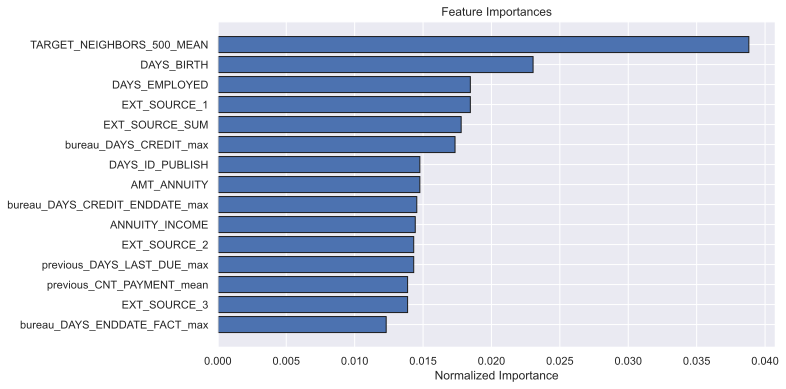

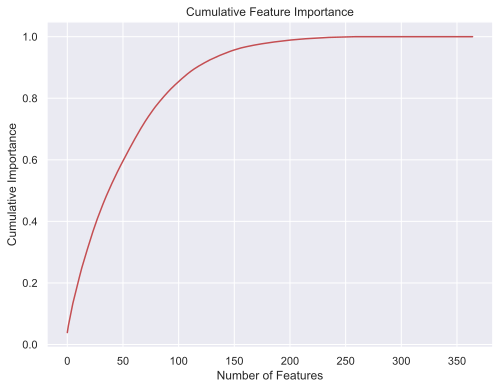

118 features required for 0.90 of cumulative importance


In [186]:
norm_feature_importances = plot_feature_importances(df_feature_importances)

In [187]:
#Let's remove the features that have zero importance.

train_lgbm = train_lgbm.drop(columns = zero_features)
test_lgbm = test_lgbm.drop(columns = zero_features)

print('train_lgbm shape: ', train_lgbm.shape)
print('test_lgbm shape: ', test_lgbm.shape)

train_lgbm shape:  (307511, 257)
test_lgbm shape:  (48744, 257)


In [188]:
train_lgbm.to_csv('train_lgbm_APRES_feature_importance_257.csv')
test_lgbm.to_csv('test_lgbm_APRES_feature_importance_257.csv')

### <span class="bg-warning"> 7.4 Résultat : colonnes à conserver d'après les 3 méthodes de feature selection<span> 

In [238]:
train = import_data('train_AVANT_feature_importance_365.csv')
del train['Unnamed: 0']

Memory usage of dataframe is 858.68 MB
Memory usage after optimization is: 191.21 MB
Decreased by 77.7%


In [239]:
feature_name = list(train.columns)
print(len(feature_name))

365


#### <span class="bg-success"> 7.4.1 Tableau des résultats<span>

In [293]:
print('Variables présentes dans la sélection lightgbm et absentes dans la sélection boruta : \n', set(df_feature_importances.feature.to_list()) - set(final_features))
print('\nVariables présentes dans la sélection boruta et absentes dans la sélection lightgbm : \n', set(final_features) - set(df_feature_importances.feature.to_list()))

Variables présentes dans la sélection lightgbm et absentes dans la sélection boruta : 
 {'ORGANIZATION_TYPE_Medicine', 'WEEKDAY_APPR_PROCESS_START_SATURDAY', 'previous_NAME_TYPE_SUITE_Other_B_count', 'OCCUPATION_TYPE_Medicinestaff', 'ORGANIZATION_TYPE_School', 'OCCUPATION_TYPE_Corestaff', 'ORGANIZATION_TYPE_Transporttype3', 'ORGANIZATION_TYPE_Transporttype4', 'bureau_CREDIT_TYPE_Consumercredit_count', 'previous_PRODUCT_COMBINATION_POShouseholdwithoutinterest_count', 'NAME_FAMILY_STATUS_Separated', 'previous_PRODUCT_COMBINATION_POSmobilewithoutinterest_count_norm', 'WALLSMATERIAL_MODE_nan', 'ORGANIZATION_TYPE_Cleaning', 'NAME_HOUSING_TYPE_Municipalapartment', 'HOUSETYPE_MODE_terracedhouse', 'bureau_CREDIT_TYPE_Loanforworkingcapitalreplenishment_count', 'bureau_CREDIT_TYPE_Creditcard_count', 'NAME_INCOME_TYPE_Commercialassociate', 'OCCUPATION_TYPE_Cookingstaff', 'bureau_CREDIT_TYPE_Cashloannonearmarked_count', 'ORGANIZATION_TYPE_Tradetype6', 'client_bureau_balance_STATUS_FAIL_mean_mean',

In [294]:
a= [
    'ORGANIZATION_TYPE_Medicine', 'WEEKDAY_APPR_PROCESS_START_SATURDAY',
    'previous_NAME_TYPE_SUITE_Other_B_count', 'OCCUPATION_TYPE_Medicinestaff',
    'ORGANIZATION_TYPE_School', 'OCCUPATION_TYPE_Corestaff',
    'ORGANIZATION_TYPE_Transporttype3', 'ORGANIZATION_TYPE_Transporttype4',
    'bureau_CREDIT_TYPE_Consumercredit_count',
    'previous_PRODUCT_COMBINATION_POShouseholdwithoutinterest_count',
    'NAME_FAMILY_STATUS_Separated',
    'previous_PRODUCT_COMBINATION_POSmobilewithoutinterest_count_norm',
    'WALLSMATERIAL_MODE_nan', 'ORGANIZATION_TYPE_Cleaning',
    'NAME_HOUSING_TYPE_Municipalapartment', 'HOUSETYPE_MODE_terracedhouse',
    'bureau_CREDIT_TYPE_Loanforworkingcapitalreplenishment_count',
    'bureau_CREDIT_TYPE_Creditcard_count',
    'NAME_INCOME_TYPE_Commercialassociate', 'OCCUPATION_TYPE_Cookingstaff',
    'bureau_CREDIT_TYPE_Cashloannonearmarked_count',
    'ORGANIZATION_TYPE_Tradetype6',
    'client_bureau_balance_STATUS_FAIL_mean_mean',
    'ORGANIZATION_TYPE_University', 'ORGANIZATION_TYPE_Industrytype3',
    'FLAG_DOCUMENT_18',
    'previous_PRODUCT_COMBINATION_POSindustrywithoutinterest_count',
    'previous_NAME_CONTRACT_TYPE_Revolvingloans_count_norm',
    'previous_NAME_CLIENT_TYPE_XNA_count',
    'NAME_EDUCATION_TYPE_Highereducation', 'ORGANIZATION_TYPE_Housing',
    'bureau_CREDIT_TYPE_Loanforworkingcapitalreplenishment_count_norm',
    'WEEKDAY_APPR_PROCESS_START_MONDAY', 'REG_REGION_NOT_WORK_REGION',
    'ORGANIZATION_TYPE_Tradetype7', 'ORGANIZATION_TYPE_Postal',
    'bureau_CREDIT_TYPE_Unknowntypeofloan_count_norm',
    'ORGANIZATION_TYPE_Realtor', 'FLAG_DOCUMENT_13',
    'previous_PRODUCT_COMBINATION_CashXSellmiddle_count_norm',
    'bureau_CREDIT_TYPE_Loanforpurchaseofsharesmarginlending_count',
    'NAME_FAMILY_STATUS_Civilmarriage', 'NAME_EDUCATION_TYPE_Academicdegree',
    'previous_PRODUCT_COMBINATION_CashXSelllow_count',
    'ORGANIZATION_TYPE_Tradetype3', 'ORGANIZATION_TYPE_Kindergarten',
    'previous_NAME_CLIENT_TYPE_XNA_count_norm', 'FLAG_DOCUMENT_11',
    'previous_NAME_CONTRACT_TYPE_Revolvingloans_count', 'NAME_TYPE_SUITE_nan',
    'ORGANIZATION_TYPE_Security', 'NAME_INCOME_TYPE_Unemployed',
    'previous_NAME_CONTRACT_TYPE_Cashloans_count',
    'previous_NAME_TYPE_SUITE_Groupofpeople_count_norm',
    'bureau_AMT_ANNUITY_mean', 'AMT_REQ_CREDIT_BUREAU_HOUR',
    'NAME_TYPE_SUITE_Children', 'CNT_NON_CHILDREN',
    'ORGANIZATION_TYPE_Insurance', 'WALLSMATERIAL_MODE_Others',
    'ORGANIZATION_TYPE_LegalServices', 'bureau_CREDIT_TYPE_Carloan_count',
    'FLAG_MOBIL', 'NAME_FAMILY_STATUS_Widow',
    'NAME_HOUSING_TYPE_Coopapartment', 'OCCUPATION_TYPE_Managers',
    'bureau_CREDIT_TYPE_Loanforbusinessdevelopment_count',
    'bureau_CREDIT_TYPE_Anothertypeofloan_count_norm',
    'previous_PRODUCT_COMBINATION_POSmobilewithinterest_count_norm',
    'ORGANIZATION_TYPE_Transporttype1', 'EMERGENCYSTATE_MODE_nan',
    'NAME_HOUSING_TYPE_Houseapartment', 'FLAG_DOCUMENT_8',
    'bureau_CREDIT_TYPE_Carloan_count_norm', 'ORGANIZATION_TYPE_Restaurant',
    'bureau_CREDIT_DAY_OVERDUE_mean', 'NAME_HOUSING_TYPE_Rentedapartment',
    'previous_NAME_TYPE_SUITE_Groupofpeople_count',
    'previous_PRODUCT_COMBINATION_CashStreethigh_count',
    'previous_PRODUCT_COMBINATION_CashStreetmiddle_count', 'FLAG_DOCUMENT_16',
    'previous_PRODUCT_COMBINATION_CashStreethigh_count_norm',
    'previous_PRODUCT_COMBINATION_CashStreetlow_count_norm',
    'ORGANIZATION_TYPE_Services', 'FLAG_EMAIL', 'OCCUPATION_TYPE_Laborers',
    'OCCUPATION_TYPE_Secretaries', 'ORGANIZATION_TYPE_Industrytype12',
    'NAME_HOUSING_TYPE_Officeapartment',
    'previous_NAME_CONTRACT_TYPE_Consumerloans_count',
    'ORGANIZATION_TYPE_Agriculture',
    'client_bureau_balance_STATUS_FAIL_max_mean',
    'ORGANIZATION_TYPE_Transporttype2', 'NAME_FAMILY_STATUS_nan',
    'WEEKDAY_APPR_PROCESS_START_SUNDAY',
    'previous_PRODUCT_COMBINATION_CashStreetmiddle_count_norm',
    'previous_NAME_TYPE_SUITE_Children_count_norm', 'NAME_HOUSING_TYPE_nan',
    'OCCUPATION_TYPE_Realtyagents', 'ORGANIZATION_TYPE_Government',
    'OCCUPATION_TYPE_HRstaff', 'NAME_FAMILY_STATUS_Singlenotmarried',
    'bureau_CNT_CREDIT_PROLONG_sum', 'ORGANIZATION_TYPE_Tradetype1',
    'previous_PRODUCT_COMBINATION_POSmobilewithinterest_count',
    'AMT_REQ_CREDIT_BUREAU_YEAR', 'ORGANIZATION_TYPE_BusinessEntityType3',
    'previous_NAME_TYPE_SUITE_Spousepartner_count',
    'OCCUPATION_TYPE_Salesstaff', 'FLAG_DOCUMENT_19',
    'NAME_TYPE_SUITE_Other_A', 'FLAG_PHONE', 'NAME_INCOME_TYPE_Stateservant',
    'previous_PRODUCT_COMBINATION_CashStreetlow_count',
    'HOUSETYPE_MODE_blockofflats', 'OCCUPATION_TYPE_Securitystaff',
    'ORGANIZATION_TYPE_Tradetype5', 'AMT_REQ_CREDIT_BUREAU_WEEK',
    'FLAG_DOCUMENT_5', 'ORGANIZATION_TYPE_Police',
    'previous_PRODUCT_COMBINATION_CardXSell_count',
    'previous_PRODUCT_COMBINATION_POSindustrywithinterest_count',
    'ORGANIZATION_TYPE_Hotel', 'ORGANIZATION_TYPE_Industrytype5',
    'FLAG_DOCUMENT_20', 'ORGANIZATION_TYPE_Tradetype4',
    'NAME_TYPE_SUITE_Family', 'bureau_AMT_ANNUITY_max',
    'ORGANIZATION_TYPE_BusinessEntityType2',
    'OCCUPATION_TYPE_LowskillLaborers', 'ORGANIZATION_TYPE_Culture',
    'AMT_REQ_CREDIT_BUREAU_QRT', 'previous_NAME_TYPE_SUITE_Other_A_count',
    'previous_NAME_CONTRACT_TYPE_XNA_count', 'ORGANIZATION_TYPE_Military',
    'ORGANIZATION_TYPE_Industrytype11',
    'previous_NAME_TYPE_SUITE_Spousepartner_count_norm',
    'ORGANIZATION_TYPE_Construction', 'ORGANIZATION_TYPE_Telecom',
    'FLAG_DOCUMENT_17', 'OCCUPATION_TYPE_ITstaff', 'CNT_CHILDREN',
    'OCCUPATION_TYPE_Cleaningstaff', 'ORGANIZATION_TYPE_Tradetype2',
    'FLAG_DOCUMENT_2', 'ORGANIZATION_TYPE_Industrytype10',
    'previous_PRODUCT_COMBINATION_POSindustrywithoutinterest_count_norm',
    'WALLSMATERIAL_MODE_Block', 'ORGANIZATION_TYPE_Other',
    'NAME_CONTRACT_TYPE_nan', 'AMT_REQ_CREDIT_BUREAU_MON',
    'previous_PRODUCT_COMBINATION_CashXSellhigh_count', 'FLAG_DOCUMENT_7',
    'FLAG_CONT_MOBILE', 'WALLSMATERIAL_MODE_Monolithic',
    'ORGANIZATION_TYPE_Industrytype2', 'ORGANIZATION_TYPE_Bank',
    'ORGANIZATION_TYPE_Emergency', 'bureau_AMT_ANNUITY_count',
    'OCCUPATION_TYPE_Privateservicestaff', 'NAME_TYPE_SUITE_Other_B',
    'ORGANIZATION_TYPE_Industrytype7', 'ORGANIZATION_TYPE_Industrytype9',
    'previous_PRODUCT_COMBINATION_CashXSellhigh_count_norm',
    'ORGANIZATION_TYPE_nan',
    'previous_PRODUCT_COMBINATION_POSotherswithoutinterest_count',
    'bureau_CREDIT_TYPE_Realestateloan_count', 'ORGANIZATION_TYPE_Mobile',
    'WALLSMATERIAL_MODE_Mixed', 'bureau_CREDIT_TYPE_Mobileoperatorloan_count',
    'FLAG_OWN_REALTY', 'FLAG_DOCUMENT_12', 'ORGANIZATION_TYPE_Advertising',
    'FLAG_DOCUMENT_21',
    'previous_PRODUCT_COMBINATION_POSindustrywithinterest_count_norm',
    'FLAG_DOCUMENT_14', 'EMERGENCYSTATE_MODE_No',
    'bureau_CREDIT_TYPE_Loanforthepurchaseofequipment_count_norm',
    'bureau_CREDIT_TYPE_Anothertypeofloan_count',
    'previous_NAME_TYPE_SUITE_Family_count', 'ORGANIZATION_TYPE_Electricity',
    'NAME_EDUCATION_TYPE_Lowersecondary', 'ORGANIZATION_TYPE_Industrytype13',
    'NAME_INCOME_TYPE_nan', 'WEEKDAY_APPR_PROCESS_START_WEDNESDAY',
    'AMT_REQ_CREDIT_BUREAU_DAY',
    'previous_PRODUCT_COMBINATION_POSotherwithinterest_count',
    'bureau_CREDIT_TYPE_Unknowntypeofloan_count',
    'OCCUPATION_TYPE_Waitersbarmenstaff', 'NAME_TYPE_SUITE_Spousepartner',
    'WEEKDAY_APPR_PROCESS_START_THURSDAY',
    'previous_PRODUCT_COMBINATION_POSotherwithinterest_count_norm',
    'OCCUPATION_TYPE_nan', 'ORGANIZATION_TYPE_Industrytype1',
    'previous_PRODUCT_COMBINATION_POShouseholdwithinterest_count',
    'OBS_30_CNT_SOCIAL_CIRCLE', 'FLAG_DOCUMENT_9', 'bureau_AMT_ANNUITY_min',
    'FLAG_DOCUMENT_4', 'REG_REGION_NOT_LIVE_REGION',
    'ORGANIZATION_TYPE_Religion', 'previous_NAME_TYPE_SUITE_Children_count',
    'SK_ID_CURR', 'WALLSMATERIAL_MODE_Wooden',
    'previous_NAME_TYPE_SUITE_Other_A_count_norm',
    'ORGANIZATION_TYPE_Industrytype6', 'NAME_INCOME_TYPE_Businessman',
    'previous_PRODUCT_COMBINATION_POSotherswithoutinterest_count_norm',
    'NAME_EDUCATION_TYPE_nan',
    'previous_PRODUCT_COMBINATION_CashXSelllow_count_norm',
    'previous_NAME_TYPE_SUITE_Unaccompanied_count',
    'WEEKDAY_APPR_PROCESS_START_nan', 'ORGANIZATION_TYPE_SecurityMinistries',
    'HOUSETYPE_MODE_nan', 'ORGANIZATION_TYPE_Selfemployed',
    'WEEKDAY_APPR_PROCESS_START_TUESDAY', 'OCCUPATION_TYPE_Highskilltechstaff',
    'previous_NAME_TYPE_SUITE_Unaccompanied_count_norm',
    'NAME_EDUCATION_TYPE_Incompletehigher',
    'bureau_CREDIT_TYPE_Consumercredit_count_norm', 'NAME_INCOME_TYPE_Student',
    'previous_PRODUCT_COMBINATION_POShouseholdwithoutinterest_count_norm',
    'bureau_CREDIT_TYPE_Interbankcredit_count',
    'ORGANIZATION_TYPE_BusinessEntityType1', 'NAME_TYPE_SUITE_Groupofpeople',
    'WEEKDAY_APPR_PROCESS_START_FRIDAY',
    'previous_PRODUCT_COMBINATION_POShouseholdwithinterest_count_norm',
    'bureau_CREDIT_TYPE_Loanforbusinessdevelopment_count_norm',
    'previous_NAME_TYPE_SUITE_Other_B_count_norm',
    'previous_NAME_CONTRACT_TYPE_Cashloans_count_norm',
    'NAME_HOUSING_TYPE_Withparents', 'ORGANIZATION_TYPE_Industrytype8',
    'WALLSMATERIAL_MODE_Panel',
    'client_bureau_balance_MONTHS_BALANCE_min_mean',
    'HOUSETYPE_MODE_specifichousing', 'Unnamed0',
    'ORGANIZATION_TYPE_Industrytype4', 'FLAG_DOCUMENT_10',
    'previous_PRODUCT_COMBINATION_POSmobilewithoutinterest_count',
    'FLAG_DOCUMENT_15', 'previous_PRODUCT_COMBINATION_CashXSellmiddle_count',
    'bureau_CREDIT_TYPE_Loanforthepurchaseofequipment_count',
    'bureau_CREDIT_TYPE_Realestateloan_count_norm'
]
len(a)

243

In [297]:
b = set(df_feature_importances.feature.to_list()) - set(a)
len(b)

122

In [301]:
print(b)

{'NONLIVINGAREA_AVG', 'OCCUPATION_TYPE_Accountants', 'EXT_SOURCE_3', 'CREDIT_INCOME', 'POS_CASH_SK_DPD_DEF_max', 'previous_DAYS_FIRST_DUE_sum', 'Instal_DAYS_BEFORE_DUE_mean', 'DAYS_ID_PUBLISH', 'APARTMENTS_AVG', 'OCCUPATION_TYPE_Drivers', 'EXT_SOURCE_SUM', 'Instal_NUM_INSTALMENT_VERSION_mean', 'previous_NAME_CLIENT_TYPE_Refreshed_count', 'Instal_PAYMENT_RATIO_max', 'previous_APP_CREDIT_PERC_min', 'bureau_CREDIT_TYPE_Microloan_count_norm', 'previous_LOAN_RATE_max', 'CODE_GENDER', 'POS_CASH_MONTHS_BALANCE_max', 'HOUR_APPR_PROCESS_START', 'DAYS_REGISTRATION', 'CREDIT_ANNUITY_RATIO', 'NAME_INCOME_TYPE_Working', 'previous_NAME_CLIENT_TYPE_New_count', 'INCOME_BY_ORG', 'TARGET_NEIGHBORS_500_MEAN', 'previous_AMT_APPLICATION_mean', 'bureau_AMT_CREDIT_MAX_OVERDUE_mean', 'DAYS_EMPLOYED', 'REG_CITY_NOT_LIVE_CITY', 'bureau_DAYS_CREDIT_ENDDATE_min', 'bureau_CREDIT_TYPE_Microloan_count', 'NAME_FAMILY_STATUS_Married', 'REGION_RATING_CLIENT', 'CB_CNT_DRAWINGS_CURRENT_mean', 'bureau_CREDIT_DAY_OVERDUE_m

In [307]:
b = [
    'NONLIVINGAREA_AVG', 'OCCUPATION_TYPE_Accountants', 'EXT_SOURCE_3',
    'CREDIT_INCOME', 'POS_CASH_SK_DPD_DEF_max', 'previous_DAYS_FIRST_DUE_sum',
    'Instal_DAYS_BEFORE_DUE_mean', 'DAYS_ID_PUBLISH', 'APARTMENTS_AVG',
    'OCCUPATION_TYPE_Drivers', 'EXT_SOURCE_SUM',
    'Instal_NUM_INSTALMENT_VERSION_mean',
    'previous_NAME_CLIENT_TYPE_Refreshed_count', 'Instal_PAYMENT_RATIO_max',
    'previous_APP_CREDIT_PERC_min', 'bureau_CREDIT_TYPE_Microloan_count_norm',
    'previous_LOAN_RATE_max', 'CODE_GENDER', 'POS_CASH_MONTHS_BALANCE_max',
    'HOUR_APPR_PROCESS_START', 'DAYS_REGISTRATION', 'CREDIT_ANNUITY_RATIO',
    'NAME_INCOME_TYPE_Working', 'previous_NAME_CLIENT_TYPE_New_count',
    'INCOME_BY_ORG', 'TARGET_NEIGHBORS_500_MEAN',
    'previous_AMT_APPLICATION_mean', 'bureau_AMT_CREDIT_MAX_OVERDUE_mean',
    'DAYS_EMPLOYED', 'REG_CITY_NOT_LIVE_CITY',
    'bureau_DAYS_CREDIT_ENDDATE_min', 'bureau_CREDIT_TYPE_Microloan_count',
    'NAME_FAMILY_STATUS_Married', 'REGION_RATING_CLIENT',
    'CB_CNT_DRAWINGS_CURRENT_mean', 'bureau_CREDIT_DAY_OVERDUE_max',
    'bureau_AMT_CREDIT_SUM_DEBT_mean', 'YEARS_BEGINEXPLUATATION_AVG',
    'Instal_DAYS_PAST_DUE_mean', 'REGION_POPULATION_RELATIVE',
    'FLAGS_DOCUMENTS_AVG', 'previous_CNT_PAYMENT_sum', 'ANNUITY_INCOME',
    'Instal_AMT_INSTALMENT_max', 'CB_CNT_DRAWINGS_ATM_CURRENT_mean',
    'DAYS_BIRTH', 'FLAG_WORK_PHONE', 'previous_NAME_CONTRACT_STATUS_mean',
    'EXT_SOURCE_2', 'Instal_AMT_PAYMENT_DIFF_sum',
    'previous_NAME_CLIENT_TYPE_New_count_norm',
    'bureau_CREDIT_TYPE_Mortgage_count_norm', 'EXT_SOURCE_1',
    'Instal_AMT_PAYMENT_min', 'previous_RATE_DOWN_PAYMENT_min',
    'DAYS_LAST_PHONE_CHANGE', 'Instal_AMT_INSTALMENT_mean',
    'previous_AMT_APPLICATION_min', 'Instal_DAYS_BEFORE_DUE_sum',
    'previous_LOAN_RATE_mean', 'bureau_DAYS_CREDIT_min', 'ENTRANCES_AVG',
    'NEW_PHONE_TO_EMPLOY_RATIO', 'FLAG_OWN_CAR', 'FLAG_DOCUMENT_6',
    'previous_AMT_GOODS_PRICE_min', 'previous_APP_CREDIT_PERC_mean',
    'Instal_AMT_PAYMENT_DIFF_mean', 'bureau_AMT_CREDIT_SUM_OVERDUE_mean',
    'bureau_CREDIT_TYPE_Mortgage_count', 'bureau_DAYS_CREDIT_max',
    'previous_DAYS_DECISION_min', 'Instal_AMT_INSTALMENT_sum',
    'CB_AMT_BALANCE_mean', 'LANDAREA_AVG', 'FLAG_CONTACTS_SUM',
    'previous_NAME_TYPE_SUITE_XNA_count',
    'previous_PRODUCT_COMBINATION_Cash_count_norm', 'AMT_INCOME_TOTAL',
    'previous_AMT_DOWN_PAYMENT_max', 'previous_SELLERPLACE_AREA_sum',
    'previous_DAYS_DECISION_mean', 'bureau_DAYS_CREDIT_UPDATE_mean',
    'bureau_DAYS_ENDDATE_FACT_var', 'Instal_DAYS_ENTRY_PAYMENT_sum',
    'previous_NAME_CLIENT_TYPE_Refreshed_count_norm', 'AMT_ANNUITY',
    'Instal_AMT_PAYMENT_DIFF_var', 'bureau_DAYS_CREDIT_var',
    'bureau_AMT_CREDIT_SUM_mean', 'bureau_DAYS_CREDIT_ENDDATE_mean',
    'BASEMENTAREA_AVG', 'bureau_AMT_CREDIT_SUM_LIMIT_mean',
    'bureau_CREDIT_ENDDATE_BINARY_mean', 'EXT_SOURCE_VAR',
    'bureau_DAYS_CREDIT_ENDDATE_max', 'Instal_DAYS_PAST_DUE_max',
    'previous_AMT_ANNUITY_max', 'previous_NAME_TYPE_SUITE_XNA_count_norm',
    'previous_NAME_TYPE_SUITE_Family_count_norm', 'FLAG_DOCUMENT_3',
    'previous_CNT_PAYMENT_mean', 'bureau_DAYS_ENDDATE_FACT_max',
    'FLAG_EMP_PHONE', 'Instal_AMT_PAYMENT_DIFF_max', 'OVER_EXPECT_CREDIT',
    'POS_CASH_MONTHS_BALANCE_size', 'Instal_DAYS_ENTRY_PAYMENT_mean',
    'REG_CITY_NOT_WORK_CITY', 'Instal_PAYMENT_RATIO_mean',
    'previous_AMT_ANNUITY_min', 'bureau_AMT_CREDIT_SUM_LIMIT_sum',
    'Instal_DAYS_BEFORE_DUE_max', 'EXT_SOURCE_MAX',
    'previous_DAYS_LAST_DUE_max', 'previous_RATE_DOWN_PAYMENT_max',
    'POS_CASH_SK_DPD_max', 'Instal_NUM_INSTALMENT_VERSION_nunique',
    'DEF_30_CNT_SOCIAL_CIRCLE', 'Instal_DAYS_PAST_DUE_sum', 'AMT_CREDIT',
    'FLOORSMAX_AVG'
]

In [304]:
print('Variables présentes dans la sélection intersection lgbm-boruta et absentes dans la sélection boostaroota : \n', set(b) - set(remaining_vars))
print('\nVariables présentes dans la sélection boostaroota et absentes dans la sélection intersection lgbm-boruta : \n', set(remaining_vars) - set(b))

Variables présentes dans la sélection intersection lgbm-boruta et absentes dans la sélection boostaroota : 
 {'OCCUPATION_TYPE_Accountants', 'FLAG_DOCUMENT_3', 'bureau_CREDIT_TYPE_Mortgage_count', 'FLAG_EMP_PHONE', 'FLAG_DOCUMENT_6', 'previous_NAME_CLIENT_TYPE_New_count', 'bureau_AMT_CREDIT_SUM_LIMIT_mean', 'previous_NAME_CLIENT_TYPE_Refreshed_count', 'Instal_PAYMENT_RATIO_max', 'REG_CITY_NOT_WORK_CITY', 'previous_RATE_DOWN_PAYMENT_min', 'Instal_AMT_PAYMENT_DIFF_var', 'previous_PRODUCT_COMBINATION_Cash_count_norm', 'bureau_CREDIT_DAY_OVERDUE_max'}

Variables présentes dans la sélection boostaroota et absentes dans la sélection intersection lgbm-boruta : 
 {'AMT_REQ_CREDIT_BUREAU_QRT', 'WEEKDAY_APPR_PROCESS_START_THURSDAY', 'previous_PRODUCT_COMBINATION_POS mobile with interest_count', 'WEEKDAY_APPR_PROCESS_START_SATURDAY', 'previous_PRODUCT_COMBINATION_POS mobile with interest_count_norm', 'previous_PRODUCT_COMBINATION_Cash Street: high_count', 'previous_PRODUCT_COMBINATION_Cash Street

In [306]:
c = [
    'OCCUPATION_TYPE_Accountants', 'FLAG_DOCUMENT_3',
    'previous_RATE_DOWN_PAYMENT_min', 'bureau_CREDIT_TYPE_Mortgage_count',
    'FLAG_EMP_PHONE', 'FLAG_DOCUMENT_6', 'previous_NAME_CLIENT_TYPE_New_count',
    'bureau_AMT_CREDIT_SUM_LIMIT_mean',
    'previous_NAME_CLIENT_TYPE_Refreshed_count', 'Instal_PAYMENT_RATIO_max',
    'REG_CITY_NOT_WORK_CITY', 'previous_PRODUCT_COMBINATION_Cash_count_norm',
    'Instal_AMT_PAYMENT_DIFF_var', 'bureau_CREDIT_DAY_OVERDUE_max'
]

In [340]:
list(set(b) - set(c))

['NONLIVINGAREA_AVG',
 'EXT_SOURCE_3',
 'Instal_AMT_INSTALMENT_mean',
 'previous_AMT_APPLICATION_min',
 'Instal_DAYS_BEFORE_DUE_sum',
 'CREDIT_INCOME',
 'previous_LOAN_RATE_mean',
 'bureau_DAYS_CREDIT_min',
 'POS_CASH_SK_DPD_DEF_max',
 'ENTRANCES_AVG',
 'NEW_PHONE_TO_EMPLOY_RATIO',
 'FLAG_OWN_CAR',
 'previous_AMT_GOODS_PRICE_min',
 'previous_APP_CREDIT_PERC_mean',
 'Instal_AMT_PAYMENT_DIFF_mean',
 'previous_DAYS_FIRST_DUE_sum',
 'Instal_DAYS_BEFORE_DUE_mean',
 'DAYS_ID_PUBLISH',
 'APARTMENTS_AVG',
 'bureau_AMT_CREDIT_SUM_OVERDUE_mean',
 'OCCUPATION_TYPE_Drivers',
 'bureau_DAYS_CREDIT_max',
 'previous_DAYS_DECISION_min',
 'EXT_SOURCE_SUM',
 'CB_AMT_BALANCE_mean',
 'Instal_AMT_INSTALMENT_sum',
 'LANDAREA_AVG',
 'Instal_NUM_INSTALMENT_VERSION_mean',
 'previous_APP_CREDIT_PERC_min',
 'bureau_CREDIT_TYPE_Microloan_count_norm',
 'previous_NAME_TYPE_SUITE_XNA_count',
 'FLAG_CONTACTS_SUM',
 'AMT_INCOME_TOTAL',
 'previous_AMT_DOWN_PAYMENT_max',
 'previous_SELLERPLACE_AREA_sum',
 'previous_DAYS_

In [308]:
set(b) - set(c)

{'AMT_ANNUITY',
 'AMT_CREDIT',
 'AMT_INCOME_TOTAL',
 'ANNUITY_INCOME',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'CB_AMT_BALANCE_mean',
 'CB_CNT_DRAWINGS_ATM_CURRENT_mean',
 'CB_CNT_DRAWINGS_CURRENT_mean',
 'CODE_GENDER',
 'CREDIT_ANNUITY_RATIO',
 'CREDIT_INCOME',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'DAYS_LAST_PHONE_CHANGE',
 'DAYS_REGISTRATION',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'ENTRANCES_AVG',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'EXT_SOURCE_MAX',
 'EXT_SOURCE_SUM',
 'EXT_SOURCE_VAR',
 'FLAGS_DOCUMENTS_AVG',
 'FLAG_CONTACTS_SUM',
 'FLAG_OWN_CAR',
 'FLAG_WORK_PHONE',
 'FLOORSMAX_AVG',
 'HOUR_APPR_PROCESS_START',
 'INCOME_BY_ORG',
 'Instal_AMT_INSTALMENT_max',
 'Instal_AMT_INSTALMENT_mean',
 'Instal_AMT_INSTALMENT_sum',
 'Instal_AMT_PAYMENT_DIFF_max',
 'Instal_AMT_PAYMENT_DIFF_mean',
 'Instal_AMT_PAYMENT_DIFF_sum',
 'Instal_AMT_PAYMENT_min',
 'Instal_DAYS_BEFORE_DUE_max',
 'Instal_DAYS_BEFORE_DUE_mean',
 'Instal_DAYS_BEFORE_DUE_sum',
 'Instal_DAYS_ENTRY_PAY

In [309]:
liste_finale=['AMT_ANNUITY',
 'AMT_CREDIT',
 'AMT_INCOME_TOTAL',
 'ANNUITY_INCOME',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'CB_AMT_BALANCE_mean',
 'CB_CNT_DRAWINGS_ATM_CURRENT_mean',
 'CB_CNT_DRAWINGS_CURRENT_mean',
 'CODE_GENDER',
 'CREDIT_ANNUITY_RATIO',
 'CREDIT_INCOME',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'DAYS_LAST_PHONE_CHANGE',
 'DAYS_REGISTRATION',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'ENTRANCES_AVG',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'EXT_SOURCE_MAX',
 'EXT_SOURCE_SUM',
 'EXT_SOURCE_VAR',
 'FLAGS_DOCUMENTS_AVG',
 'FLAG_CONTACTS_SUM',
 'FLAG_OWN_CAR',
 'FLAG_WORK_PHONE',
 'FLOORSMAX_AVG',
 'HOUR_APPR_PROCESS_START',
 'INCOME_BY_ORG',
 'Instal_AMT_INSTALMENT_max',
 'Instal_AMT_INSTALMENT_mean',
 'Instal_AMT_INSTALMENT_sum',
 'Instal_AMT_PAYMENT_DIFF_max',
 'Instal_AMT_PAYMENT_DIFF_mean',
 'Instal_AMT_PAYMENT_DIFF_sum',
 'Instal_AMT_PAYMENT_min',
 'Instal_DAYS_BEFORE_DUE_max',
 'Instal_DAYS_BEFORE_DUE_mean',
 'Instal_DAYS_BEFORE_DUE_sum',
 'Instal_DAYS_ENTRY_PAYMENT_mean',
 'Instal_DAYS_ENTRY_PAYMENT_sum',
 'Instal_DAYS_PAST_DUE_max',
 'Instal_DAYS_PAST_DUE_mean',
 'Instal_DAYS_PAST_DUE_sum',
 'Instal_NUM_INSTALMENT_VERSION_mean',
 'Instal_NUM_INSTALMENT_VERSION_nunique',
 'Instal_PAYMENT_RATIO_mean',
 'LANDAREA_AVG',
 'NAME_FAMILY_STATUS_Married',
 'NAME_INCOME_TYPE_Working',
 'NEW_PHONE_TO_EMPLOY_RATIO',
 'NONLIVINGAREA_AVG',
 'OCCUPATION_TYPE_Drivers',
 'OVER_EXPECT_CREDIT',
 'POS_CASH_MONTHS_BALANCE_max',
 'POS_CASH_MONTHS_BALANCE_size',
 'POS_CASH_SK_DPD_DEF_max',
 'POS_CASH_SK_DPD_max',
 'REGION_POPULATION_RELATIVE',
 'REGION_RATING_CLIENT',
 'REG_CITY_NOT_LIVE_CITY',
 'TARGET_NEIGHBORS_500_MEAN',
 'YEARS_BEGINEXPLUATATION_AVG',
 'bureau_AMT_CREDIT_MAX_OVERDUE_mean',
 'bureau_AMT_CREDIT_SUM_DEBT_mean',
 'bureau_AMT_CREDIT_SUM_LIMIT_sum',
 'bureau_AMT_CREDIT_SUM_OVERDUE_mean',
 'bureau_AMT_CREDIT_SUM_mean',
 'bureau_CREDIT_ENDDATE_BINARY_mean',
 'bureau_CREDIT_TYPE_Microloan_count',
 'bureau_CREDIT_TYPE_Microloan_count_norm',
 'bureau_CREDIT_TYPE_Mortgage_count_norm',
 'bureau_DAYS_CREDIT_ENDDATE_max',
 'bureau_DAYS_CREDIT_ENDDATE_mean',
 'bureau_DAYS_CREDIT_ENDDATE_min',
 'bureau_DAYS_CREDIT_UPDATE_mean',
 'bureau_DAYS_CREDIT_max',
 'bureau_DAYS_CREDIT_min',
 'bureau_DAYS_CREDIT_var',
 'bureau_DAYS_ENDDATE_FACT_max',
 'bureau_DAYS_ENDDATE_FACT_var',
 'previous_AMT_ANNUITY_max',
 'previous_AMT_ANNUITY_min',
 'previous_AMT_APPLICATION_mean',
 'previous_AMT_APPLICATION_min',
 'previous_AMT_DOWN_PAYMENT_max',
 'previous_AMT_GOODS_PRICE_min',
 'previous_APP_CREDIT_PERC_mean',
 'previous_APP_CREDIT_PERC_min',
 'previous_CNT_PAYMENT_mean',
 'previous_CNT_PAYMENT_sum',
 'previous_DAYS_DECISION_mean',
 'previous_DAYS_DECISION_min',
 'previous_DAYS_FIRST_DUE_sum',
 'previous_DAYS_LAST_DUE_max',
 'previous_LOAN_RATE_max',
 'previous_LOAN_RATE_mean',
 'previous_NAME_CLIENT_TYPE_New_count_norm',
 'previous_NAME_CLIENT_TYPE_Refreshed_count_norm',
 'previous_NAME_CONTRACT_STATUS_mean',
 'previous_NAME_TYPE_SUITE_Family_count_norm',
 'previous_NAME_TYPE_SUITE_XNA_count',
 'previous_NAME_TYPE_SUITE_XNA_count_norm',
 'previous_RATE_DOWN_PAYMENT_max',
 'previous_SELLERPLACE_AREA_sum']

In [310]:
print(liste_finale)
print(len(liste_finale))

['AMT_ANNUITY', 'AMT_CREDIT', 'AMT_INCOME_TOTAL', 'ANNUITY_INCOME', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'CB_AMT_BALANCE_mean', 'CB_CNT_DRAWINGS_ATM_CURRENT_mean', 'CB_CNT_DRAWINGS_CURRENT_mean', 'CODE_GENDER', 'CREDIT_ANNUITY_RATIO', 'CREDIT_INCOME', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'DAYS_LAST_PHONE_CHANGE', 'DAYS_REGISTRATION', 'DEF_30_CNT_SOCIAL_CIRCLE', 'ENTRANCES_AVG', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'EXT_SOURCE_MAX', 'EXT_SOURCE_SUM', 'EXT_SOURCE_VAR', 'FLAGS_DOCUMENTS_AVG', 'FLAG_CONTACTS_SUM', 'FLAG_OWN_CAR', 'FLAG_WORK_PHONE', 'FLOORSMAX_AVG', 'HOUR_APPR_PROCESS_START', 'INCOME_BY_ORG', 'Instal_AMT_INSTALMENT_max', 'Instal_AMT_INSTALMENT_mean', 'Instal_AMT_INSTALMENT_sum', 'Instal_AMT_PAYMENT_DIFF_max', 'Instal_AMT_PAYMENT_DIFF_mean', 'Instal_AMT_PAYMENT_DIFF_sum', 'Instal_AMT_PAYMENT_min', 'Instal_DAYS_BEFORE_DUE_max', 'Instal_DAYS_BEFORE_DUE_mean', 'Instal_DAYS_BEFORE_DUE_sum', 'Instal_DAYS_ENTRY_PAYMENT_mean', 'Instal_DAYS_ENTRY_PAYMENT_sum

#### <span class="bg-success"> 7.4.2 Train après feature selection<span>

In [319]:
data_train = pd.read_csv('train_AVANT_feature_importance_365.csv')

In [320]:
del data_train['Unnamed: 0']

In [321]:
data_train.shape

(307511, 365)

In [322]:
summarise(data_train)

,n_missing,p_missing,n_unique,dtype
SK_ID_CURR,0,0.0,307511,int64
bureau_AMT_ANNUITY_count,0,0.0,45,float64
bureau_AMT_CREDIT_SUM_LIMIT_mean,0,0.0,38928,float64
bureau_AMT_CREDIT_SUM_OVERDUE_mean,0,0.0,1873,float64
bureau_AMT_CREDIT_SUM_DEBT_mean,0,0.0,169324,float64
bureau_AMT_CREDIT_SUM_mean,0,0.0,209591,float64
bureau_AMT_CREDIT_MAX_OVERDUE_mean,0,0.0,55271,float64
bureau_CREDIT_DAY_OVERDUE_mean,0,0.0,1541,float64
bureau_CREDIT_DAY_OVERDUE_max,0,0.0,868,float64
bureau_DAYS_ENDDATE_FACT_var,0,0.0,133364,float64


In [323]:
train = data_train.loc[:, liste_finale]

In [324]:
summarise(train)

,n_missing,p_missing,n_unique,dtype
AMT_ANNUITY,0,0.0,13672,float64
bureau_AMT_CREDIT_SUM_LIMIT_sum,0,0.0,37279,float64
bureau_DAYS_CREDIT_max,0,0.0,2923,float64
bureau_DAYS_CREDIT_UPDATE_mean,0,0.0,55038,float64
bureau_DAYS_CREDIT_ENDDATE_min,0,0.0,6828,float64
bureau_DAYS_CREDIT_ENDDATE_mean,0,0.0,97904,float64
bureau_DAYS_CREDIT_ENDDATE_max,0,0.0,13030,float64
bureau_CREDIT_TYPE_Mortgage_count_norm,0,0.0,75,float64
bureau_CREDIT_TYPE_Microloan_count_norm,0,0.0,194,float64
bureau_CREDIT_TYPE_Microloan_count,0,0.0,30,float64


In [325]:
# Variable Target
train['TARGET'] = data_train['TARGET']

In [ ]:
# Id_client
train['SK_ID_CURR'] = train_lgbm_ids 

In [326]:
train.shape

(307511, 109)

#### <span class="bg-success"> 7.4.3 Test après feature selection<span>

In [327]:
test = pd.read_csv('test_AVANT_feature_importance_364.csv')

In [328]:
test = test.loc[:, liste_finale]
test['SK_ID_CURR'] = test_lgbm_ids 
print(test.shape)

(48744, 108)


In [329]:
summarise(test)

,n_missing,p_missing,n_unique,dtype
AMT_ANNUITY,0,0.0,7491,float64
bureau_AMT_CREDIT_SUM_LIMIT_sum,0,0.0,6239,float64
bureau_DAYS_CREDIT_max,0,0.0,2553,float64
bureau_DAYS_CREDIT_UPDATE_mean,0,0.0,19789,float64
bureau_DAYS_CREDIT_ENDDATE_min,0,0.0,4580,float64
bureau_DAYS_CREDIT_ENDDATE_mean,0,0.0,27832,float64
bureau_DAYS_CREDIT_ENDDATE_max,0,0.0,7744,float64
bureau_CREDIT_TYPE_Mortgage_count_norm,0,0.0,54,float64
bureau_CREDIT_TYPE_Microloan_count_norm,0,0.0,151,float64
bureau_CREDIT_TYPE_Microloan_count,0,0.0,31,float64


In [330]:
train.shape

(307511, 109)

In [331]:
test.shape

(48744, 108)

#### <span class="bg-success"> 7.4.4 Exportation train/test<span>

In [332]:
train.to_csv('train_final.csv', index=False)
test.to_csv('test_final.csv', index=False)

### <span class="bg-warning"> 7.5 RFECV<span>  

In [333]:
train = pd.read_csv('train_model_109.csv')
test = pd.read_csv('test_model_108.csv')

In [334]:
train_RFECV = train.copy()
test_RFECV = test.copy()

In [335]:
from sklearn.feature_selection import RFECV

In [336]:
y_train = train_RFECV['TARGET'] 
X_train = train_RFECV.drop('TARGET', axis=1)

In [337]:
classifier = XGBClassifier(random_state=101)
selector = RFECV(estimator=classifier, step=1, scoring='roc_auc', cv = 2)
selector.fit(X_train, y_train)

RFECV(cv=2,
      estimator=XGBClassifier(base_score=None, booster=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, gamma=None, gpu_id=None,
                              importance_type='gain',
                              interaction_constraints=None, learning_rate=None,
                              max_delta_step=None, max_depth=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, n_estimators=100,
                              n_jobs=None, num_parallel_tree=None,
                              random_state=101, reg_alpha=None, reg_lambda=None,
                              scale_pos_weight=None, subsample=None,
                              tree_method=None, validate_parameters=None,
                              verbosity=None),
      scoring='roc_auc')

In [338]:
print('Le nombre optimal de variables est {}'.format(selector.n_features_))
features = [f for f,s in zip(X_train.columns, selector.support_) if s]
print('Les variables sélectionnées sont:')
print ('{}'.format(features))

Le nombre optimal de variables est 48
Les variables sélectionnées sont:
['AMT_ANNUITY', 'ANNUITY_INCOME', 'CB_AMT_BALANCE_mean', 'CB_CNT_DRAWINGS_ATM_CURRENT_mean', 'CB_CNT_DRAWINGS_CURRENT_mean', 'CODE_GENDER', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'DEF_30_CNT_SOCIAL_CIRCLE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'EXT_SOURCE_SUM', 'FLAGS_DOCUMENTS_AVG', 'FLAG_OWN_CAR', 'FLAG_WORK_PHONE', 'FLOORSMAX_AVG', 'Instal_AMT_INSTALMENT_max', 'Instal_AMT_INSTALMENT_sum', 'Instal_AMT_PAYMENT_DIFF_mean', 'Instal_DAYS_ENTRY_PAYMENT_sum', 'Instal_DAYS_PAST_DUE_mean', 'Instal_PAYMENT_RATIO_mean', 'NAME_FAMILY_STATUS_Married', 'NAME_INCOME_TYPE_Working', 'OCCUPATION_TYPE_Drivers', 'OVER_EXPECT_CREDIT', 'POS_CASH_SK_DPD_DEF_max', 'REGION_RATING_CLIENT', 'REG_CITY_NOT_LIVE_CITY', 'TARGET_NEIGHBORS_500_MEAN', 'bureau_AMT_CREDIT_MAX_OVERDUE_mean', 'bureau_AMT_CREDIT_SUM_DEBT_mean', 'bureau_AMT_CREDIT_SUM_OVERDUE_mean', 'bureau_AMT_CREDIT_SUM_mean', 'bureau_CREDIT_ENDDATE_BINARY_mean

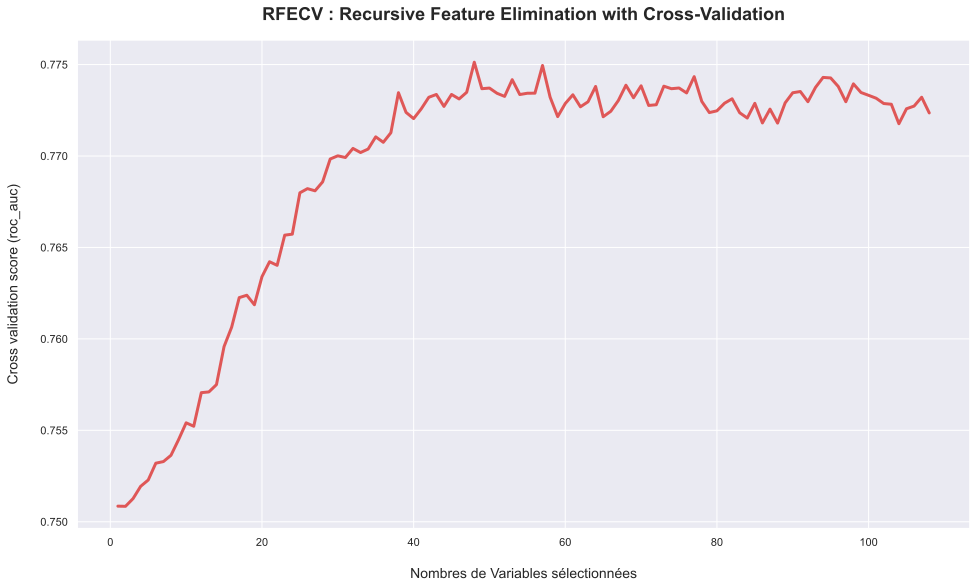

In [339]:
plt.figure(figsize=(16, 9))
plt.title('RFECV : Recursive Feature Elimination with Cross-Validation', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Nombres de Variables sélectionnées', fontsize=14, labelpad=20)
plt.ylabel("Cross validation score (roc_auc)", fontsize=14, labelpad=20)
plt.plot(range(1, len(selector.grid_scores_) + 1), selector.grid_scores_, color='#DF5757', linewidth=3)